In [79]:
import cooler
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import multiprocessing as mp
import h5py
import pickle
import seaborn as sns
import tqdm

from scipy import stats

from statsmodels.stats.multitest import multipletests

import sys
import itertools
import time

sys.path.insert(0, '/cndd/fangming/CEMBA/snmcseq_dev')
from __init__ import *
from __init__jupyterlab import * 
import snmcseq_utils

In [2]:
default_colorbar_kws = DEFAULT_COLORBAR_KWS

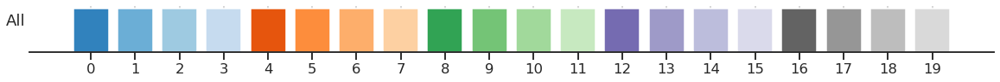

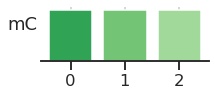

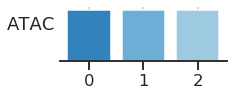

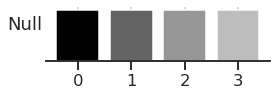

In [3]:
# color palette
cm = plt.cm.tab20c.colors

# settle down on a color palette
colors_mc = [cm[8], cm[9], cm[10],]
colors_atac = [cm[0], cm[1], cm[2],]
colors_null = ['black', cm[16], cm[17], cm[18],]

color_tracks = [
    cm,
    colors_mc,
    colors_atac,
    colors_null,
]

labels = [
    'All',
    'mC',
    'ATAC',
    'Null',
]

for color_track, label in zip(color_tracks, labels):
    n = len(color_track)
    fig, ax = plt.subplots(figsize=(1*n,1))
    ax.bar(np.arange(n), 1, 
           color=color_track)
    ax.set_xticks(np.arange(n))
    ax.set_ylabel(label, rotation=0, ha='right')
    sns.despine(ax=ax, left=True)
    ax.set_yticks([])
    plt.show()

In [4]:
mod_palette = {
    'mc': 'C2',
    'atac': 'C0',
    'null': 'k',
}

mod_palette_comp = {
    'mc': colors_mc,
    'atac': colors_atac,
    'null': colors_null,
}


KB = 1000
def p25(x):
    return np.percentile(x, 25)
def p75(x):
    return np.percentile(x, 75)


In [5]:
def kth_diag_indices(n, k=0):
    """
    """
    assert k >= 0
    
    row_idx = np.arange(n)
    col_idx = np.arange(n)
    
    col_idx = row_idx + k
    
    if k > 0:
        return row_idx[:-k], col_idx[:-k]
    if k == 0:
        return row_idx, col_idx

def mat_values_kth_diag_indices(mat, k=0):
    """
    """
    return mat[kth_diag_indices(len(mat), k=k)]

In [6]:
def enh_gene_id_to_binidx(_table, tsss, enhs, resolution):
    """
    Given a dataframe of enh-gene pairs (by IDs)
    return which bins in HiC data they correspond to
    
    Return a dataframe with dist_bin as index, 'gene_bin', 'enh_bin' as columns
    """
    # merge gid, enh_id with genome locations
    _tmp = pd.merge(_table, tsss.rename(columns={'chr': 'gene_chr',
                                                 'start': 'gene_start',
                                                 'end': 'gene_end',
                                                 'gid': 'gene',
                                                }), on='gene')

    _tmp = pd.merge(_tmp, enhs.rename(columns={'chr': 'enh_chr',
                                               'start': 'enh_start',
                                               'end': 'enh_end',
                                               'center': 'enh_center',
                                               'enh_id': 'enh',
                                              }), on='enh')
    # find the correct bins
    _tmp['enh_bin'] = (_tmp['enh_center'].values/resolution).astype(int)
    _tmp['gene_bin'] = (_tmp['gene_start'].values/resolution).astype(int)
    _tmp['dist_bin'] = np.abs(_tmp['enh_bin'] - _tmp['gene_bin'])
    _tmp = _tmp.set_index('dist_bin')
    
    return _tmp

# Contact frequencies as a function of genomic distance 

In [8]:
# 
chromosome = 'chr1'
celltype = 'L2/3'

# L2/3 cell types contacts
# with h5py.File('/cndd2/Public_Datasets/m3c_Lee_etal_2019/L2_3_all_brain.txt_1kb_contacts.mcool') as f:
    
f = h5py.File('/cndd2/Public_Datasets/m3c_Lee_etal_2019/L2_3_all_brain.txt_1kb_contacts.mcool')
print(
    list(f.keys()), 
    list(f['resolutions']),
    list(f['resolutions']['1000'].keys()), 
)

# pick one resolution 
resolution = 5000
print(str(resolution))
mycooler = cooler.Cooler(f['resolutions'][str(resolution)])

mat_all = mycooler.matrix(balance=True).fetch(chromosome)

In [9]:

mat = mat_all 
distance_cutoff = 1e6

contacts_mean = []
contacts_std = []
distance_idx = np.arange(1, int(distance_cutoff/resolution))
distances = distance_idx * resolution
for i in distance_idx:
    contacts = mat_values_kth_diag_indices(mat, k=i)
    contacts_mean.append(np.nanmean(contacts)) 
    contacts_std.append(np.nanstd(contacts)) 
    
contacts_mean = np.array(contacts_mean)
contacts_std = np.array(contacts_std)

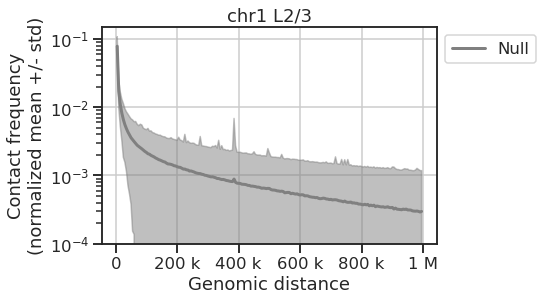

In [10]:
fig, ax = plt.subplots()
_x, _y, _yerr = distances, contacts_mean, contacts_std
color='gray'

ax.plot(_x, _y, '-', color=color, linewidth=3, label='Null')
ax.fill_between(_x, _y-_yerr, _y+_yerr, color=color, alpha=0.5)

ax.xaxis.set_major_formatter(mtick.EngFormatter())
ax.set_xlabel('Genomic distance')
ax.set_ylabel('Contact frequency\n(normalized mean +/- std)')
ax.set_yscale('log')
# ax.set_xscale('log')
ax.set_title("{} {}".format(chromosome, celltype))

ax.legend(bbox_to_anchor=(1,1), loc='upper left')
plt.show()

# Contact frequency of any enhancer-gene pairs

In [11]:
# enhancers lifted
f = './hic_from_ethan/enhancers_lifted.bed'
enh_list = pd.read_csv(f, sep='\t', header=None, names=['chr', 'start', 'end', 'enh_id'])
enh_list['center'] = (enh_list['start'] + enh_list['end'])/2
print(enh_list.shape)
enh_list.head()

# tss lifted
f = './hic_from_ethan/tss_lifted.bed'
tss_list = pd.read_csv(f, sep='\t', header=None, names=['chr', 'start', 'end', 'gid'])
print(tss_list.shape)
tss_list.head()

# enh - tss linked list


(126134, 5)
(33814, 4)


,chr,start,end,gid
0,chr8,55102323,55102324,ENSMUSG00000051951
1,chr4,83273518,83273519,ENSMUSG00000102851
2,chr8,55409874,55409875,ENSMUSG00000103377
3,chr8,55288183,55288184,ENSMUSG00000089699
4,chr8,55230212,55230213,ENSMUSG00000103201


In [12]:
ti = time.time()

# all pairs of enh and gene within distance cutoff (1Mb)
enhs = enh_list[enh_list['chr']=='chr1']
tsss = tss_list[tss_list['chr']=='chr1']

# bins
enh_bins = np.sort((enhs['center'].values/resolution).astype(int))
tsss_bins = np.sort((tsss['start'].values/resolution).astype(int))
print(enhs.shape, tsss.shape)

# comb bins
combs = np.array(list(itertools.product(enh_bins, tsss_bins)))
combs_df = pd.DataFrame()
combs_df['enh_bin'] = combs[:,0]
combs_df['gene_bin'] = combs[:,1]
combs_df['dist_bin'] = np.abs(combs_df['enh_bin'] - combs_df['gene_bin'])
combs_df = combs_df[combs_df['dist_bin']<=int(distance_cutoff/resolution)]
combs_df = combs_df.set_index('dist_bin')
print(combs_df.shape)

print(time.time()-ti)

(11010, 5) (3378, 4)
(317833, 2)
19.834193468093872


In [13]:

mat = mat_all 
    
distance_cutoff = 1e6
distance_idx = np.arange(1, int(distance_cutoff/resolution))
distances = distance_idx * resolution

contacts_mean = []
contacts_std = []

contacts_pairs_mean = []
contacts_pairs_std = []

for i in tqdm.tqdm(distance_idx):
    contacts = mat_values_kth_diag_indices(mat, k=i)
    
    try:
        pairs = combs_df.loc[i]
        contacts_pairs = mat[(pairs['enh_bin'].values, 
                              pairs['gene_bin'].values, 
                             )]
    except:
        contact_pairs = []
    
    
    contacts_mean.append(np.nanmean(contacts)) 
    contacts_std.append(np.nanstd(contacts)) 
    
    contacts_pairs_mean.append(np.nanmean(contacts_pairs)) 
    contacts_pairs_std.append(np.nanstd(contacts_pairs)) 
    
contacts_mean = np.array(contacts_mean)
contacts_std = np.array(contacts_std)

contacts_pairs_mean = np.array(contacts_pairs_mean)
contacts_pairs_std = np.array(contacts_pairs_std)

100%|██████████| 199/199 [00:05<00:00, 35.81it/s]


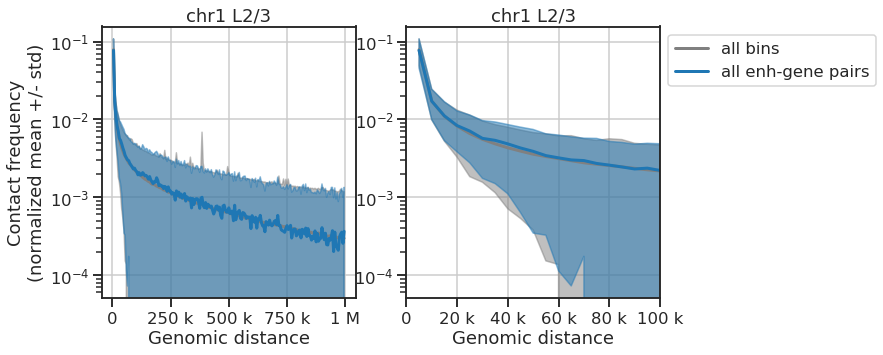

In [14]:
fig, axs = plt.subplots(1, 2, figsize=(5*2,5))

for i, ax in enumerate(axs):
    _x, _y, _yerr = distances, contacts_mean, contacts_std
    color='gray'
    ax.plot(_x, _y, '-', color=color, linewidth=3, label='all bins')
    ax.fill_between(_x, _y-_yerr, _y+_yerr, color=color, alpha=0.5)

    _x, _y, _yerr = distances, contacts_pairs_mean, contacts_pairs_std
    color='C0'
    ax.plot(_x, _y, '-', color=color, linewidth=3, label='all enh-gene pairs')
    ax.fill_between(_x, _y-_yerr, _y+_yerr, color=color, alpha=0.5)

    ax.xaxis.set_major_formatter(mtick.EngFormatter())
    ax.set_yscale('log')
    ax.set_xlabel('Genomic distance')
    ax.set_title("{} {}".format(chromosome, celltype))
    
    if i == 0:
        ax.set_ylabel('Contact frequency\n(normalized mean +/- std)')

ax.set_xlim([0, 1e5])
ax.legend(bbox_to_anchor=(1,1), loc='upper left')
plt.show()

# Contact frequency of correlated and linked enhancer-gene pairs

In [7]:
# # original enhancer index
# f = ('/cndd2/fangming/projects/scf_enhancers/scripts/scf_enhancer_paper'
#      '/hic/hic_from_ethan/data/enhancer_bed.bed'
#     )
# enhs_orig = pd.read_csv(f, sep='\t').rename(columns={
#     '0': 'chr', '1': 'start', '2': 'end', '4': 'index'
#     })
# print(enhs_orig.shape)
# enhs_orig.head()


In [8]:
# orig significant pairs (enh_index and gid)

# load some results
f = '/sphere/fangming/enhancers/scripts/results_new/fig2_201027_linked_pairs_mc.tsv'
linked_pairs_mc = pd.read_csv(f, sep="\t")
print(linked_pairs_mc.shape)

f = '/sphere/fangming/enhancers/scripts/results_new/fig2_201027_linked_pairs_atac.tsv'
linked_pairs_atac = pd.read_csv(f, sep="\t")
print(linked_pairs_atac.shape)

f = '/sphere/fangming/enhancers/scripts/results_new/fig2_201027_correlated_pairs_mc.tsv'
correlated_pairs_mc = pd.read_csv(f, sep="\t")
print(correlated_pairs_mc.shape)

f = '/sphere/fangming/enhancers/scripts/results_new/fig2_201027_correlated_pairs_atac.tsv'
correlated_pairs_atac = pd.read_csv(f, sep="\t")
print(correlated_pairs_atac.shape)

linked_pairs_mc.head()

(7455, 3)
(3879, 3)
(85596, 3)
(50012, 3)


,gene,enh,dist
0,ENSMUSG00000000058,181997,14555
1,ENSMUSG00000000088,221978,48225
2,ENSMUSG00000000126,35942,90017
3,ENSMUSG00000000126,35953,4552
4,ENSMUSG00000000126,35954,5567


# Settings - for massive deploy

- resolutions, chromosomes, cell types

Todo: 
- make sure the enhancer indices are correct 
- make sure the HiC map indices are correct

In [124]:
def get_contact_stats(mat, paired_bin_tables, resolution, distance_cutoff=1e6):
    """
    """
    distance_idx = np.arange(1, int(distance_cutoff/resolution))
    distances = distance_idx * resolution

    contacts_mean = []
    contacts_std = []
    contacts_sig_pairs_mean = collections.OrderedDict({_label: [] for _label, _table in paired_bin_tables.items()})
    contacts_sig_pairs_std = collections.OrderedDict({_label: [] for _label, _table in paired_bin_tables.items()})

    for i in tqdm.tqdm(distance_idx):
        contacts = mat_values_kth_diag_indices(mat, k=i)
        contacts_mean.append(np.nanmean(contacts)) 
        contacts_std.append(np.nanstd(contacts)) 

        for _label, _table in paired_bin_tables.items():
            try:
                pairs = _table.loc[i]
                contacts_sig_pairs = mat[(pairs['enh_bin'].values, pairs['gene_bin'].values)]
            except:
                contacts_sig_pairs = []

            contacts_sig_pairs_mean[_label].append(np.nanmean(contacts_sig_pairs)) 
            contacts_sig_pairs_std[_label].append(np.nanstd(contacts_sig_pairs)) 

    contacts_mean = np.array(contacts_mean)
    contacts_std = np.array(contacts_std)

    contacts_sig_pairs_mean = collections.OrderedDict({
                    _label: np.array(_table) for _label, _table in contacts_sig_pairs_mean.items()})
    contacts_sig_pairs_std = collections.OrderedDict({
                    _label: np.array(_table) for _label, _table in contacts_sig_pairs_std.items()})

    return (contacts_mean, contacts_std, 
            contacts_sig_pairs_mean, contacts_sig_pairs_std,
           )

def get_contacts(mat, paired_bin_tables, resolution, distance_idx):
    """
    given distances/distance idx; 
    - contacts: a list of numpy arrays
    - contacts_sig_pairs: a dict of list of numpy arrays 
    """

    contacts = []
    contacts_sig_pairs = collections.OrderedDict({_label: [] for _label, _table in paired_bin_tables.items()})

    for i in tqdm.tqdm(distance_idx):
        _contacts = mat_values_kth_diag_indices(mat, k=i)
        contacts.append(_contacts) 

        for _label, _table in paired_bin_tables.items():
            try:
                pairs = _table.loc[i]
                _contacts_sig_pairs = mat[(pairs['enh_bin'].values, pairs['gene_bin'].values)]
            except:
                _contacts_sig_pairs = []
            contacts_sig_pairs[_label].append(_contacts_sig_pairs) 

    return (contacts, contacts_sig_pairs)

In [10]:
def plot_contact_stats(
    chromosome, celltype, resolution,
    distances, contacts_mean, contacts_std, 
    contacts_sig_pairs_mean, contacts_sig_pairs_std, 
    track_names, colors,
    output_fig,
    ):
    """
    """
    
    fig, axs = plt.subplots(2, 4, figsize=(5*4,5*2), sharey=True, sharex=True)

    # all together
    ax = axs[0,0]
    _x, _y, _yerr = distances, contacts_mean, contacts_std
    color='gray'
    ax.plot(_x, _y, '-', color=color, linewidth=3, label='all_bins')
    for i, (_name, _color) in enumerate(zip(track_names, colors)):
        _x, _y, _yerr = distances, contacts_sig_pairs_mean[_name], contacts_sig_pairs_std[_name]
        ax.plot(_x, _y, '-', color=_color, linewidth=3, label=_name)
        
    ax.xaxis.set_major_formatter(mtick.EngFormatter())
    ax.set_yscale('log')
    ax.set_xlabel('Genomic distance')
    ax.set_xlim([0, 1e5])
    ax.set_ylim([1e-3, 1e-1])
    ax.set_ylabel('Contact frequency\n(normalized mean +/- std)')
    ax.set_title("{} {}, {} HiC resolution".format(chromosome, celltype, resolution))

    for ax in axs[0,1:]:
        ax.axis('off')

    # specific plots
    for i, (ax, _name, _color) in enumerate(zip(axs[1], track_names, colors)):
        _x, _y, _yerr = distances, contacts_mean, contacts_std
        color='gray'
        ax.fill_between(_x, _y-_yerr, _y+_yerr, color=color, alpha=0.2)
        ax.plot(_x, _y, '-', color=color, linewidth=5, label='all_bins', alpha=1)

        _x, _y, _yerr = distances, contacts_sig_pairs_mean[_name], contacts_sig_pairs_std[_name]
        ax.fill_between(_x, _y-_yerr, _y+_yerr, color=_color, alpha=0.2)
        ax.plot(_x, _y, '-', color=_color, linewidth=5, label=_name, alpha=1)

        ax.xaxis.set_major_formatter(mtick.EngFormatter())
        ax.set_yscale('log')
        ax.set_xlabel('Genomic distance')
        ax.set_xlim([0, 1e5])
        ax.set_ylim([1e-3, 1e-1])

        if i == 0:
            ax.set_ylabel('Contact frequency\n(normalized mean +/- std)')

    # legends
    handles, labels = snmcseq_utils.combine_legends(axs.flat)
    handles, labels = snmcseq_utils.dedup_legends(handles, labels)
    axs[0,1].legend(handles, labels, bbox_to_anchor=(1,1), loc='upper left')
    
    snmcseq_utils.savefig(fig, output_fig)
    plt.show()
    
    return 

In [11]:
chromosomes = ['chr'+str(i+1) for i in range(22)] + ['chrX']
celltypes = ['L2_3', 'L4', 'L5', 'L6', 
             'Pvalb', 'Sst', 'Vip', 'Ndnf']
resolutions = [
#     1000, 
#     2000, # memory problems
    5000, 
    10000, 
    20000, # not useful 
#     50000, 
#     100000, # 100kb 
]

celltype = 'L2_3'
resolution = 10000
chromosome = 'chr1'

# Apply this to different HiC map 

- resolutions, chromosomes, cell types

Todo: 
- make sure the enhancer indices are correct 
- make sure the HiC map indices are correct

In [20]:

file = '/cndd2/Public_Datasets/m3c_Lee_etal_2019/{}_all_brain.txt_1kb_contacts.mcool'.format(celltype)
with h5py.File(file) as fh:
    # # # pick one resolution 
    mycooler = cooler.Cooler(fh['resolutions'][str(resolution)])
    mat_all = mycooler.matrix(balance=True).fetch(chromosome)

In [21]:
mat_all.shape

(49851, 49851)

  0%|          | 0/199 [00:00<?, ?it/s]/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1423: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
100%|██████████| 199/199 [00:00<00:00, 288.26it/s]


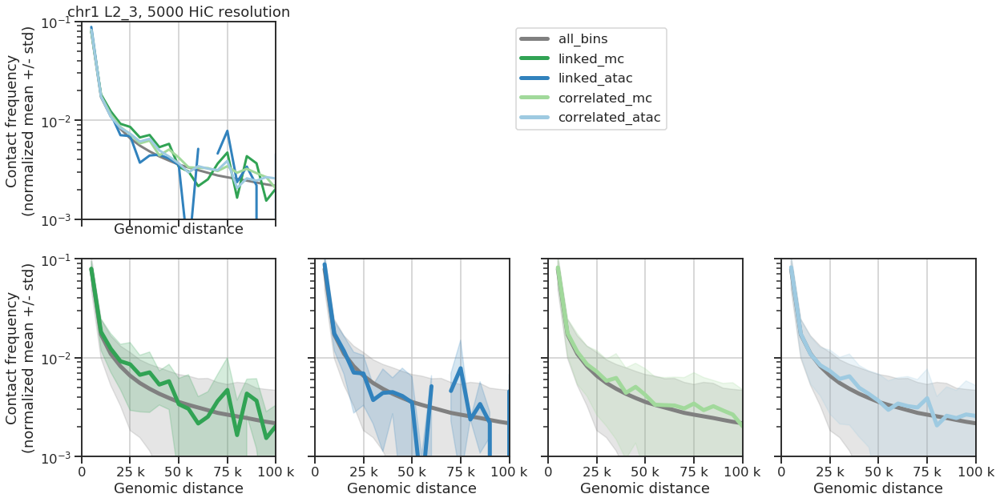

100%|██████████| 99/99 [00:00<00:00, 381.05it/s]


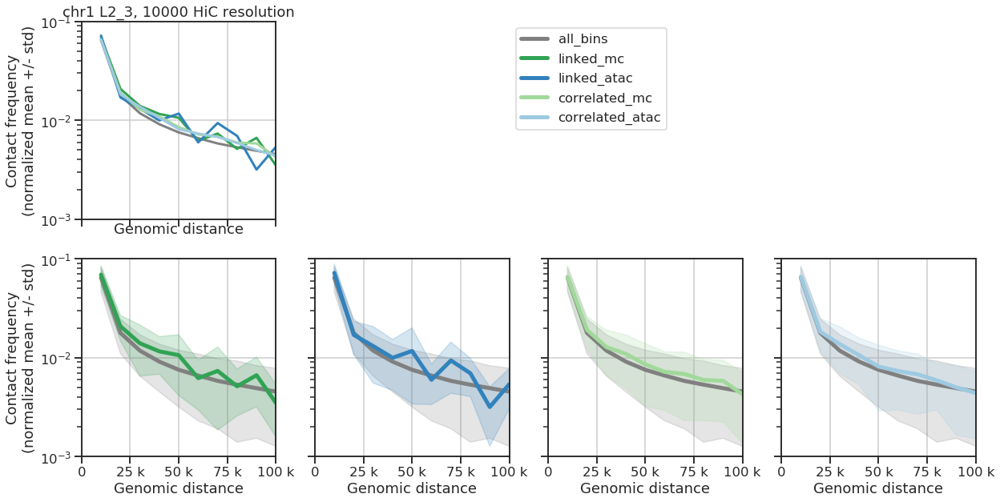

100%|██████████| 49/49 [00:00<00:00, 392.45it/s]


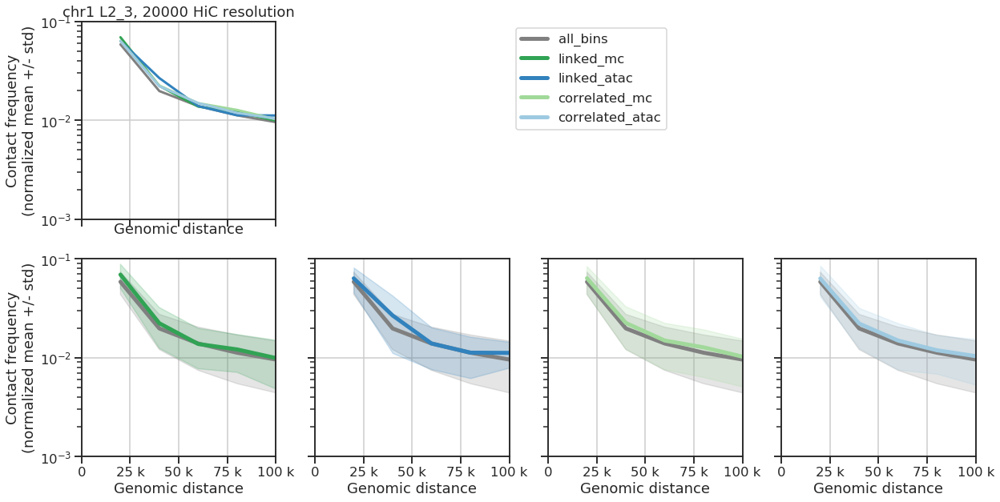

In [22]:
# assuming this enhancer id is the same as the one ethan used
celltype = 'L2_3'
resolution = 5000
chromosome = 'chr1'

for resolution in resolutions:
    
    file = '/cndd2/Public_Datasets/m3c_Lee_etal_2019/{}_all_brain.txt_1kb_contacts.mcool'.format(celltype)
    with h5py.File(file) as fh:
        # # # pick one resolution 
        mycooler = cooler.Cooler(fh['resolutions'][str(resolution)])
        mat_all = mycooler.matrix(balance=True).fetch(chromosome)
    
    output_fig = ('/sphere/fangming/enhancers/scripts/figures/'
                  'hic_contact_enrichment{}_{}_{}.pdf'.format(celltype, resolution, chromosome)
                 )

    # distances
    distance_cutoff = 1e6
    distance_idx = np.arange(1, int(distance_cutoff/resolution))
    distances = distance_idx * resolution
    
    enhs = enh_list[enh_list['chr']==chromosome]
    tsss = tss_list[tss_list['chr']==chromosome]

    # get paired bins
    paired_bin_tables = collections.OrderedDict({
        'linked_mc': enh_gene_id_to_binidx(linked_pairs_mc, tsss, enhs, resolution),
        'linked_atac': enh_gene_id_to_binidx(linked_pairs_atac, tsss, enhs, resolution),
        'correlated_mc': enh_gene_id_to_binidx(correlated_pairs_mc, tsss, enhs, resolution),
        'correlated_atac': enh_gene_id_to_binidx(correlated_pairs_atac, tsss, enhs, resolution),
    })
    track_names = list(paired_bin_tables.keys())
    colors = [
        mod_palette_comp['mc'][0],
        mod_palette_comp['atac'][0],
        mod_palette_comp['mc'][2],
        mod_palette_comp['atac'][2],
    ]

    # contact stats
    (contacts_mean, contacts_std,
     contacts_sig_pairs_mean, contacts_sig_pairs_std,
    ) = get_contact_stats(mat_all, paired_bin_tables, resolution, distance_cutoff=1e6)

    # plot
    plot_contact_stats(
        chromosome, celltype, resolution,
        distances, contacts_mean, contacts_std, 
        contacts_sig_pairs_mean, contacts_sig_pairs_std, 
        track_names, colors,
        output_fig,
        )

  0%|          | 0/99 [00:00<?, ?it/s]/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1423: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
100%|██████████| 99/99 [00:00<00:00, 474.59it/s]


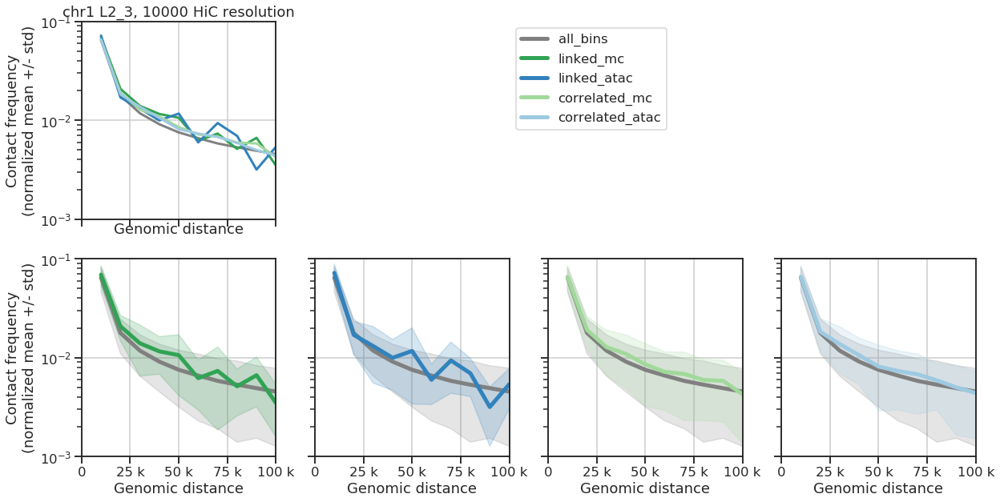

100%|██████████| 99/99 [00:00<00:00, 356.18it/s]


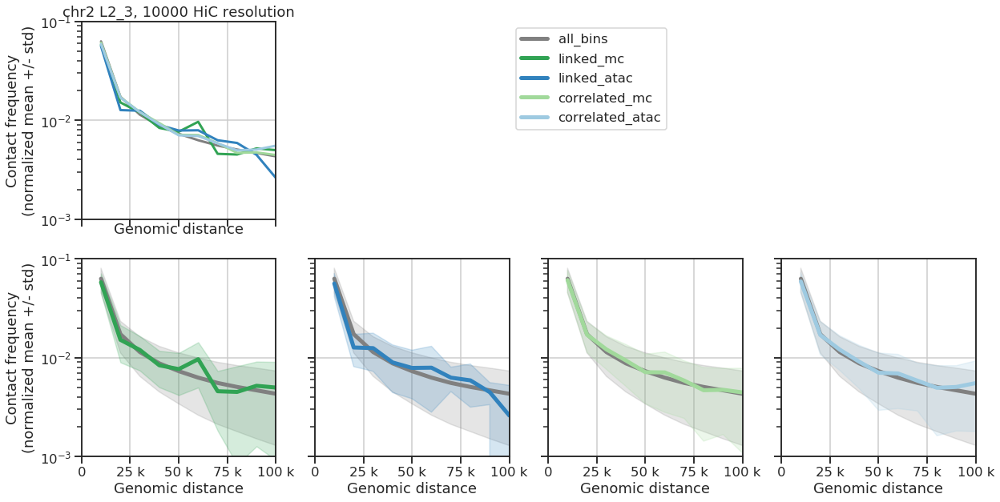

100%|██████████| 99/99 [00:00<00:00, 553.79it/s]


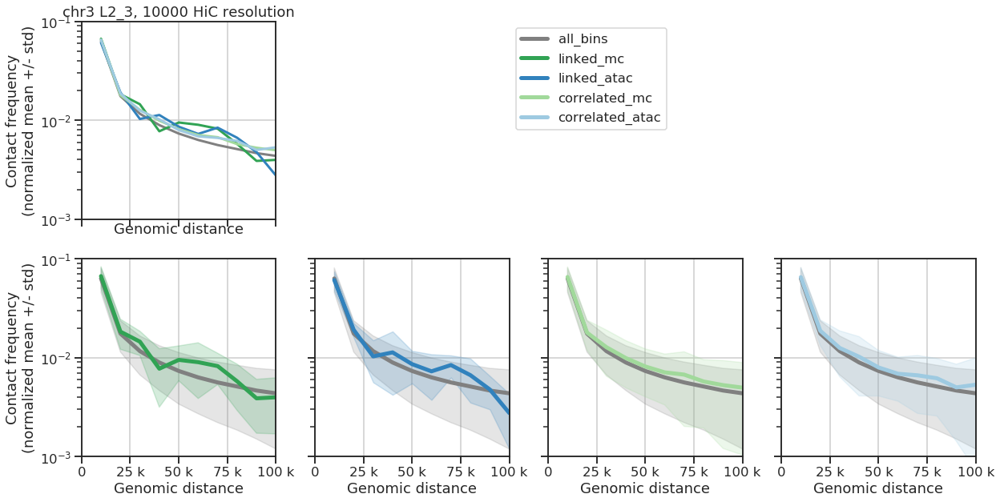

100%|██████████| 99/99 [00:00<00:00, 361.98it/s]


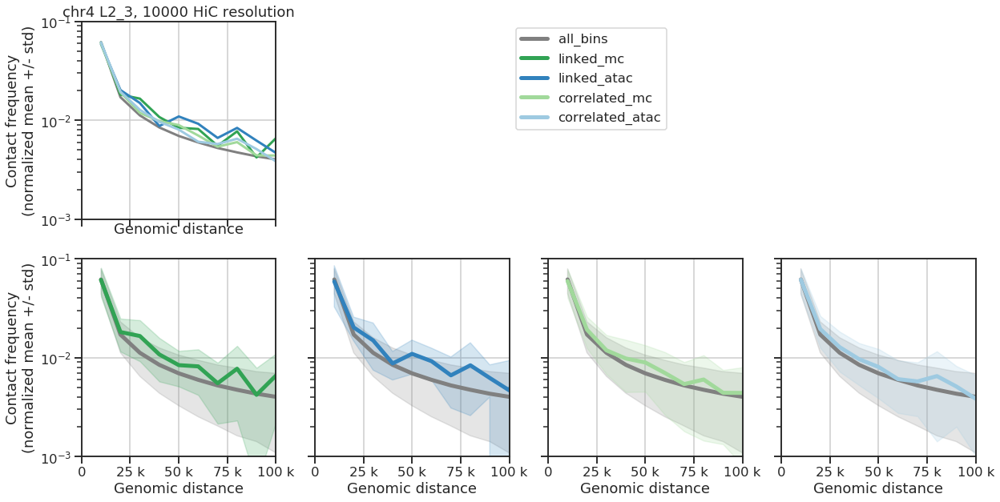

100%|██████████| 99/99 [00:00<00:00, 507.00it/s]


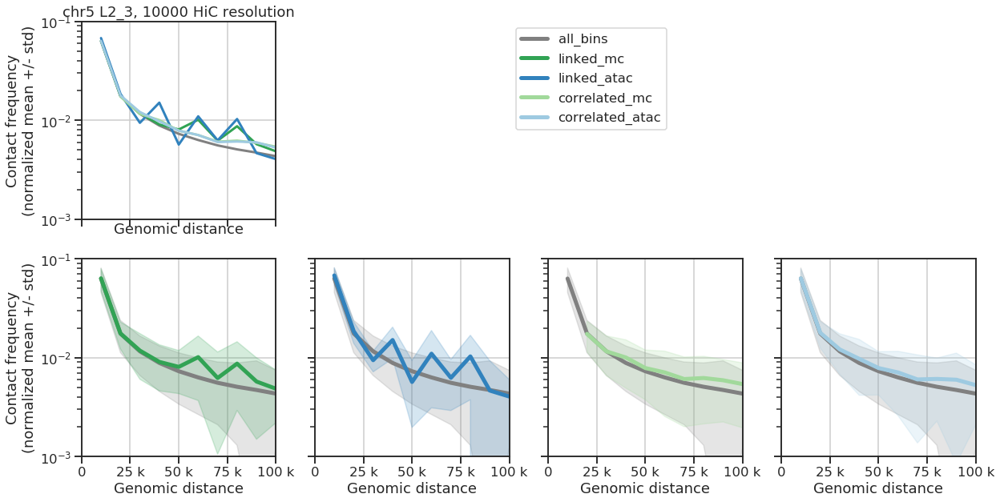

100%|██████████| 99/99 [00:00<00:00, 552.10it/s]


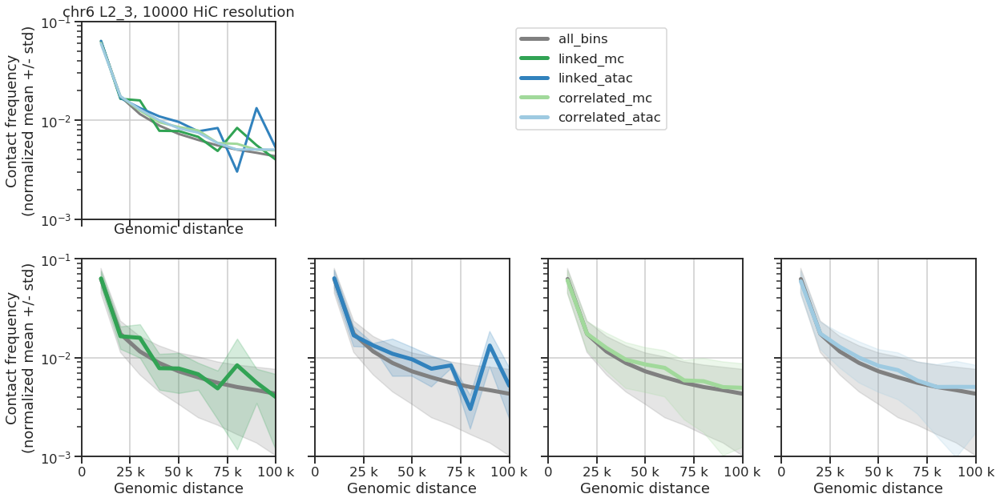

100%|██████████| 99/99 [00:00<00:00, 576.41it/s]


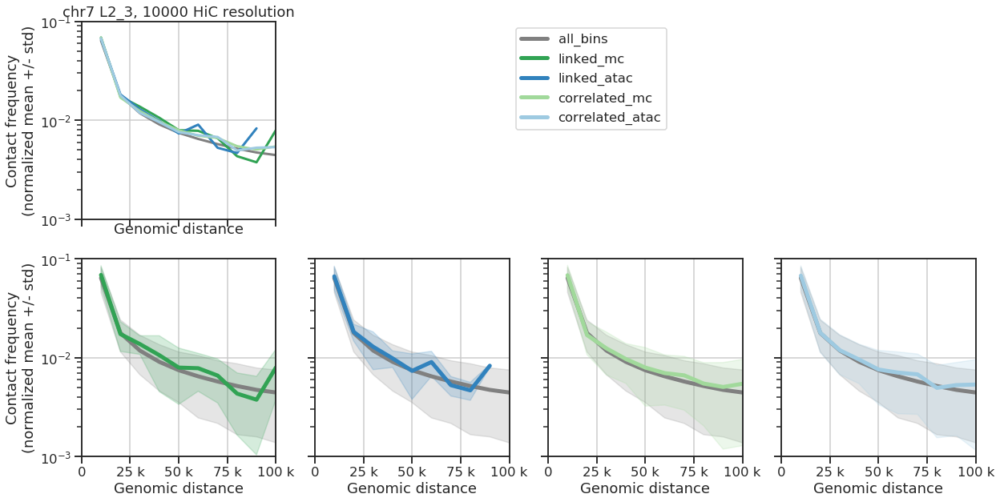

100%|██████████| 99/99 [00:00<00:00, 553.39it/s]


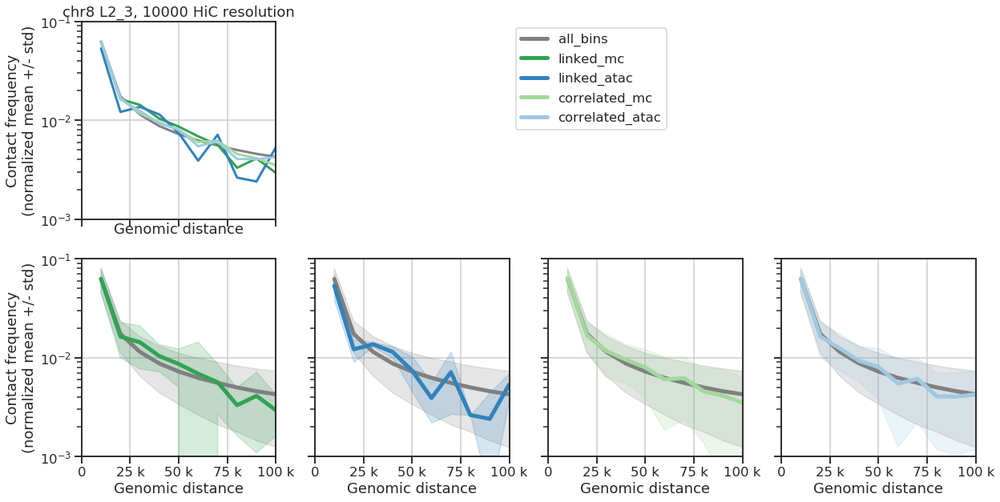

100%|██████████| 99/99 [00:00<00:00, 530.47it/s]


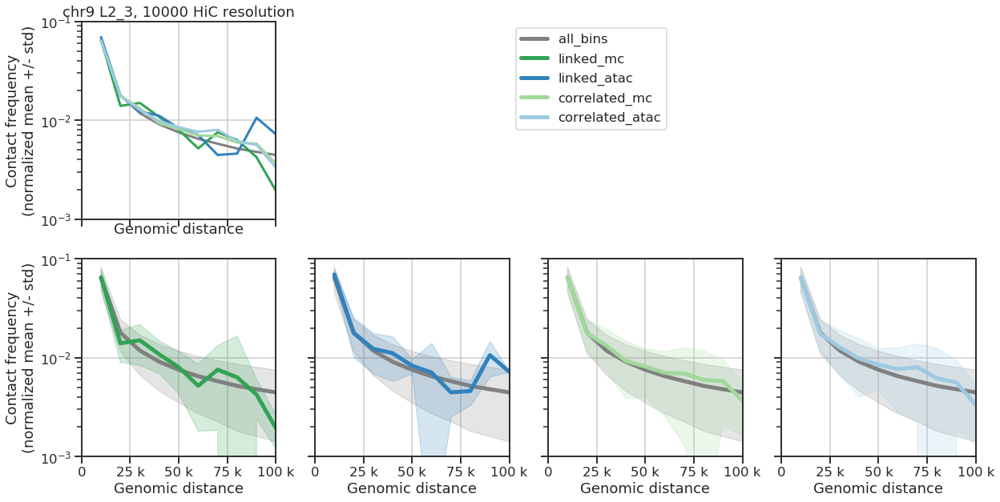

100%|██████████| 99/99 [00:00<00:00, 382.47it/s]


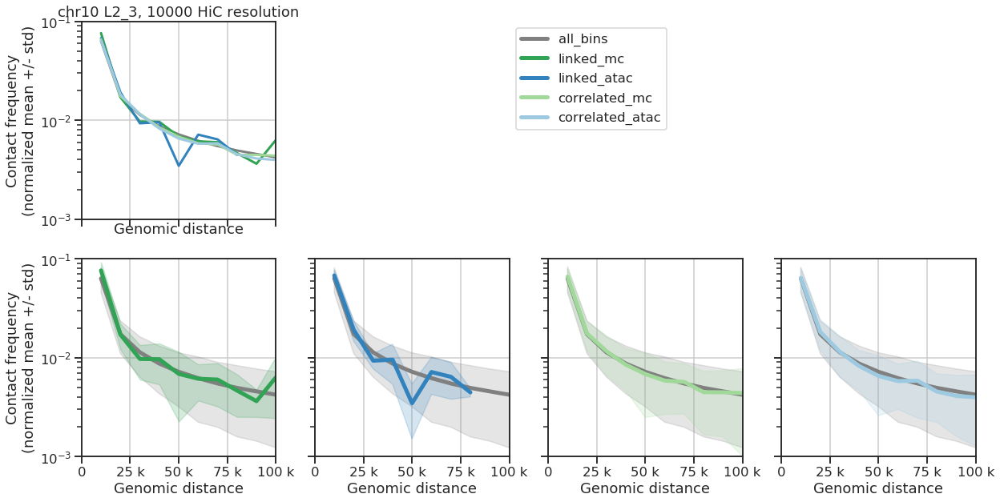

100%|██████████| 99/99 [00:00<00:00, 569.58it/s]


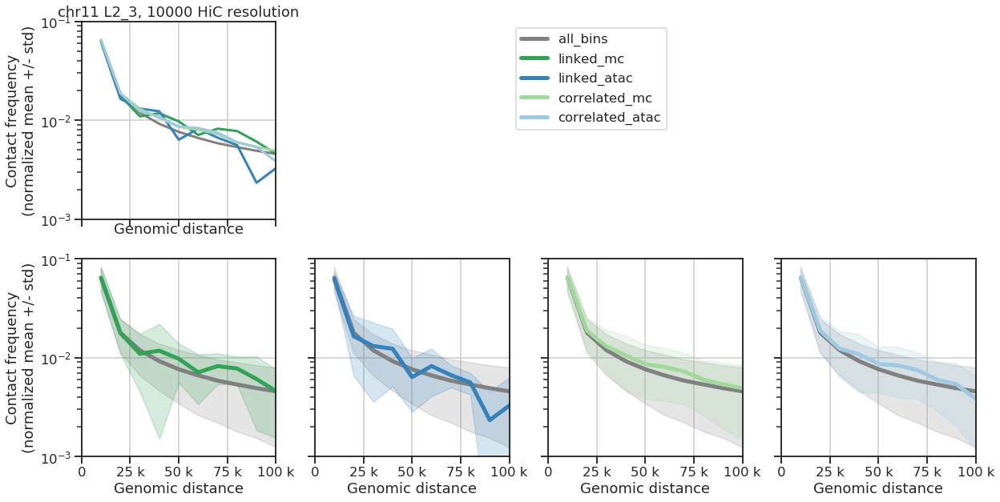

100%|██████████| 99/99 [00:00<00:00, 625.81it/s]


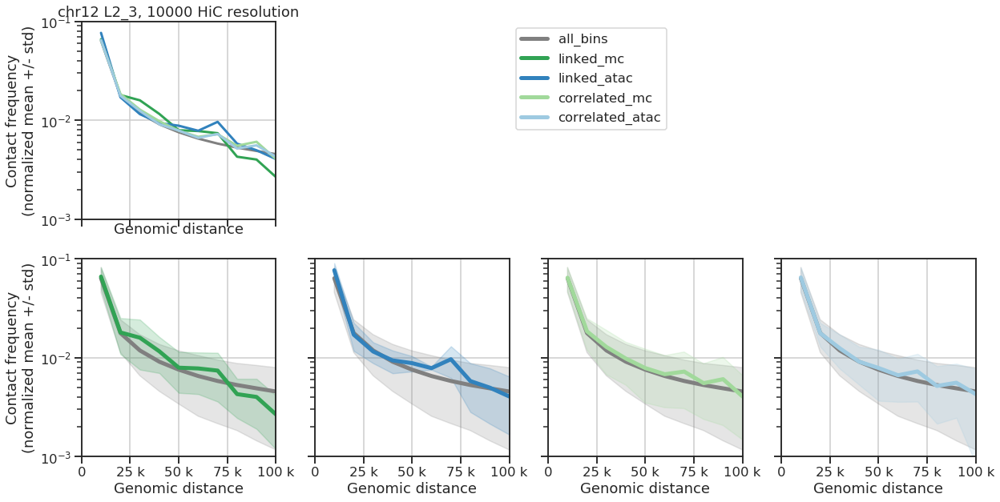

100%|██████████| 99/99 [00:00<00:00, 592.31it/s]


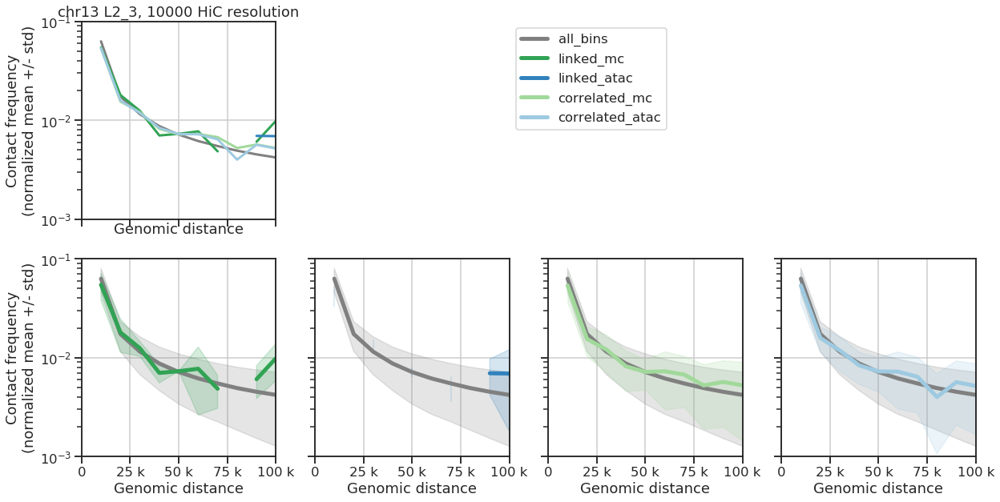

100%|██████████| 99/99 [00:00<00:00, 731.34it/s]


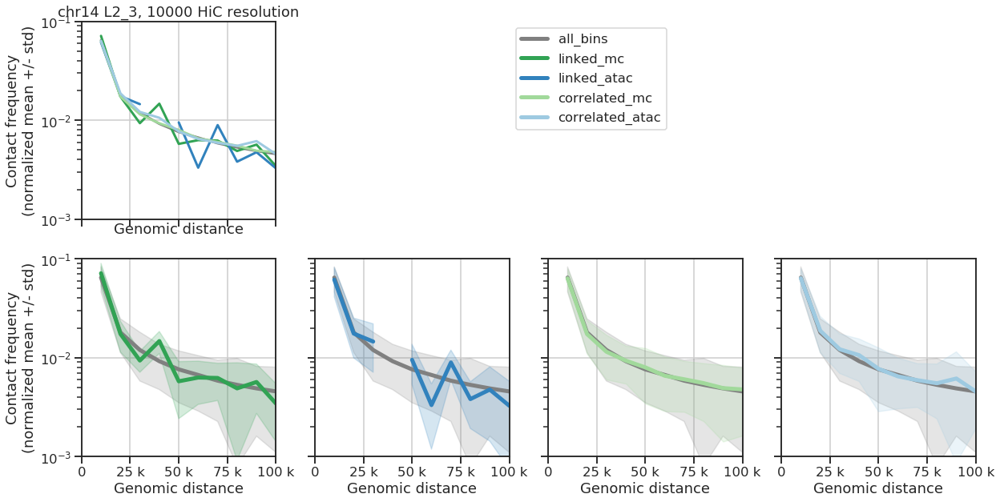

100%|██████████| 99/99 [00:00<00:00, 599.68it/s]


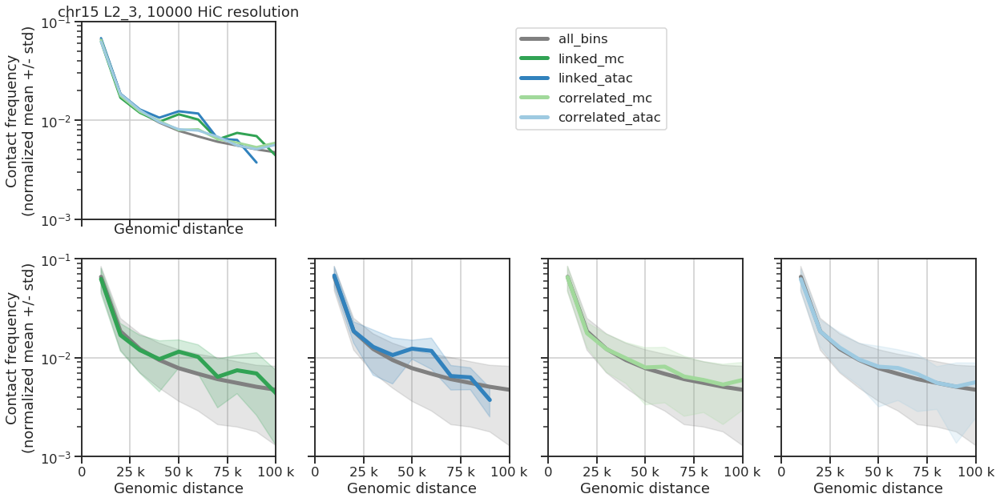

100%|██████████| 99/99 [00:00<00:00, 393.34it/s]


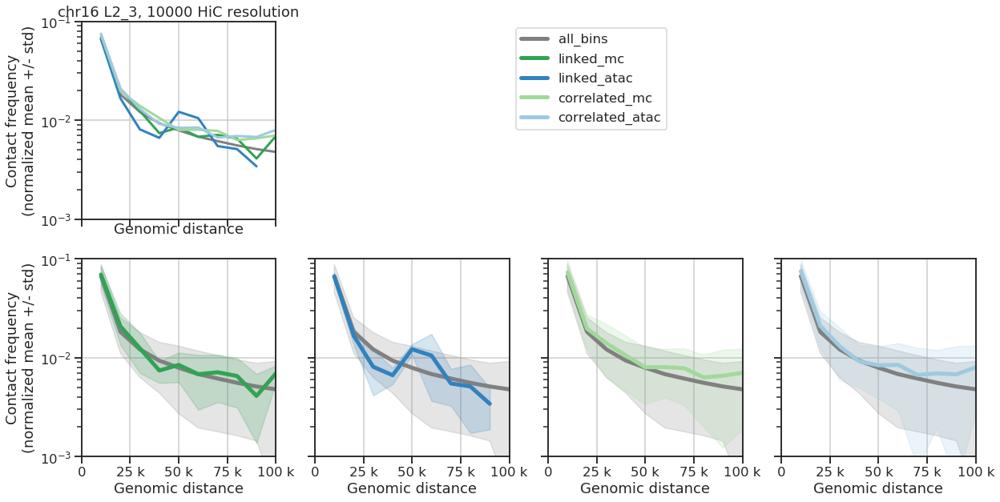

100%|██████████| 99/99 [00:00<00:00, 731.99it/s]


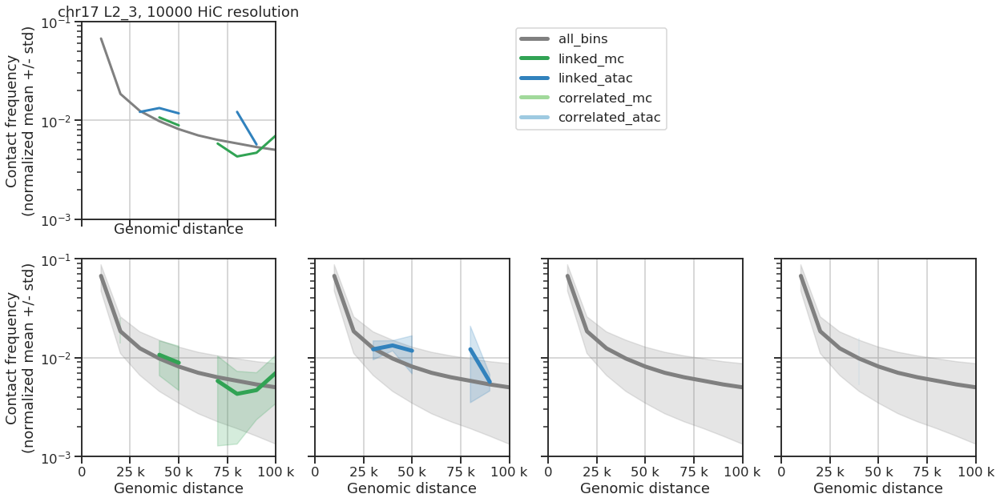

100%|██████████| 99/99 [00:00<00:00, 789.03it/s]


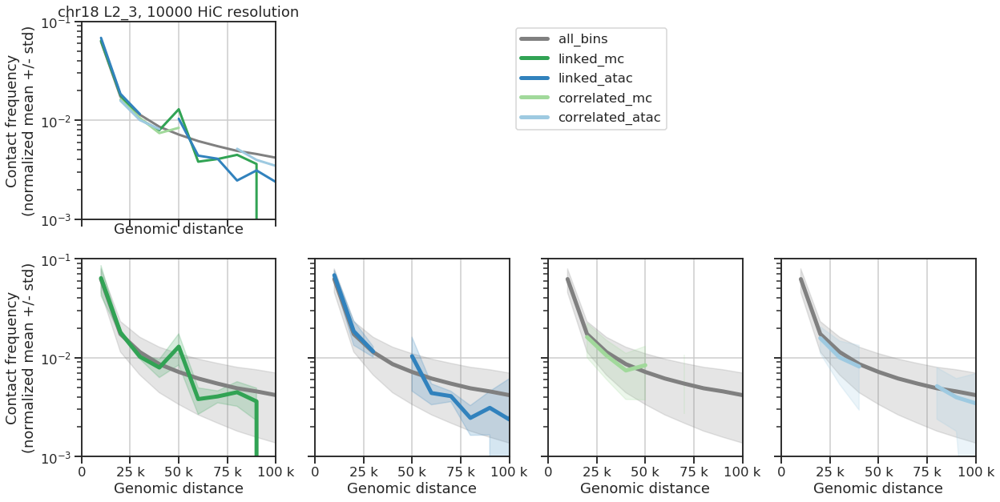

100%|██████████| 99/99 [00:00<00:00, 796.28it/s]


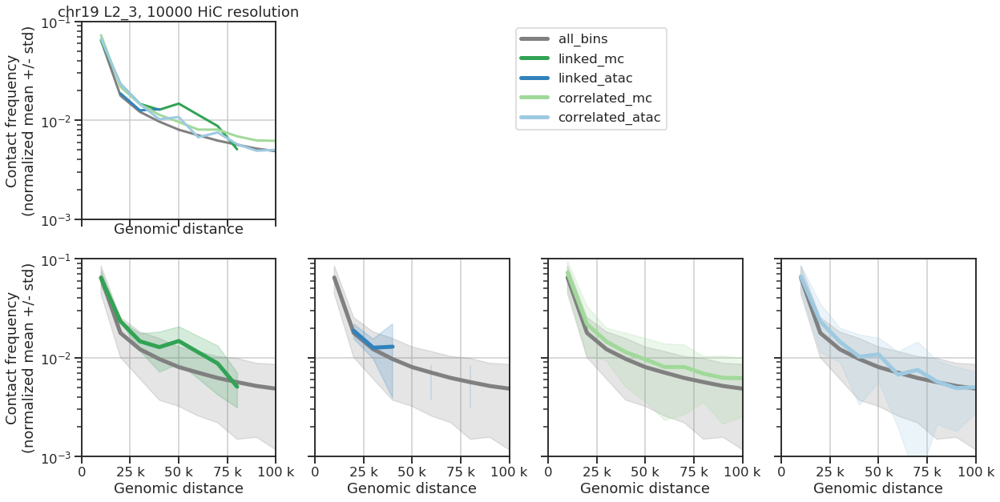

100%|██████████| 99/99 [00:00<00:00, 540.72it/s]


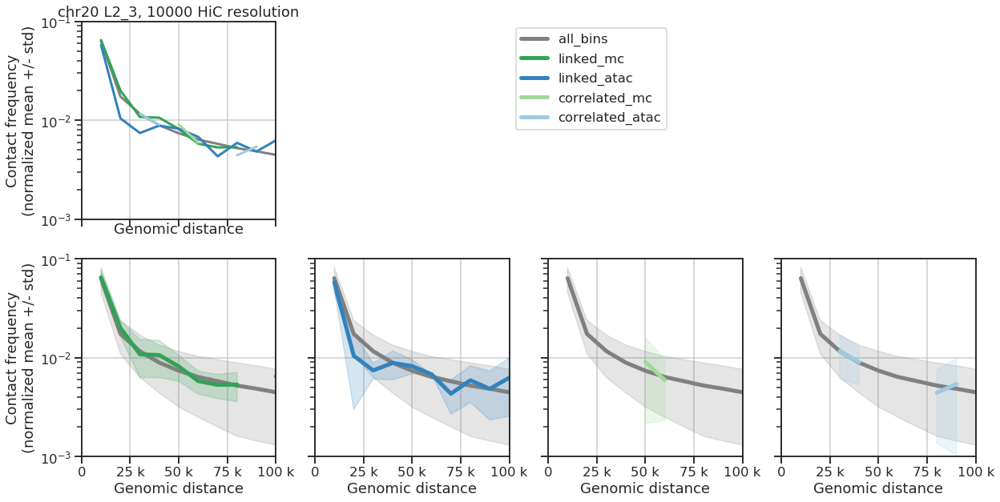

100%|██████████| 99/99 [00:00<00:00, 975.14it/s]


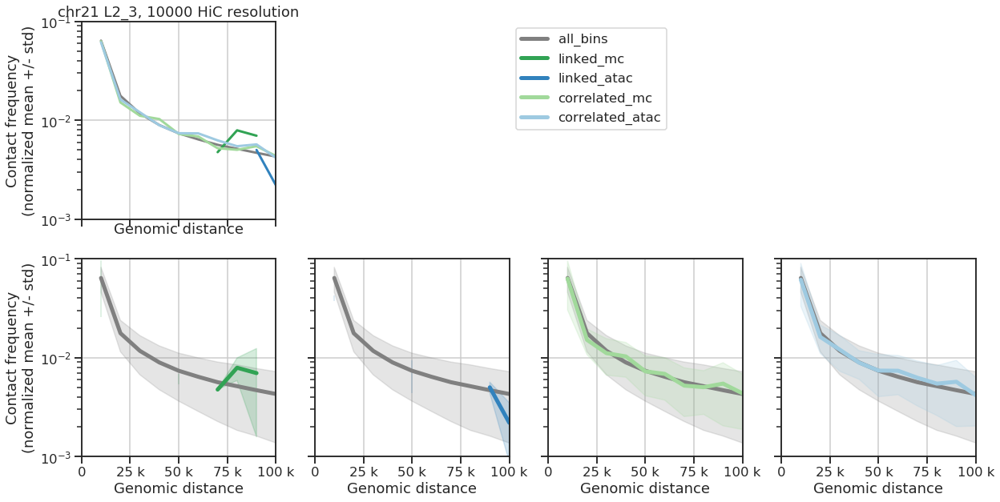

100%|██████████| 99/99 [00:00<00:00, 413.85it/s]


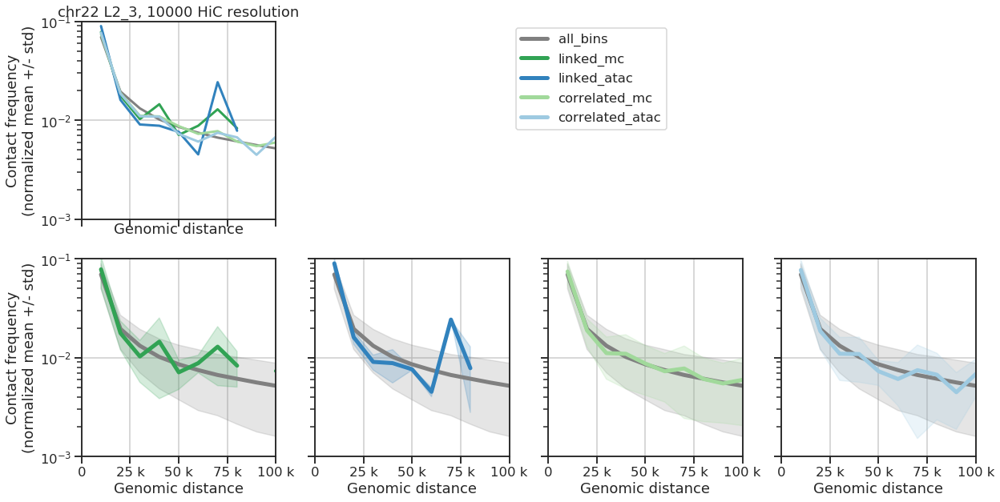

100%|██████████| 99/99 [00:00<00:00, 442.94it/s]


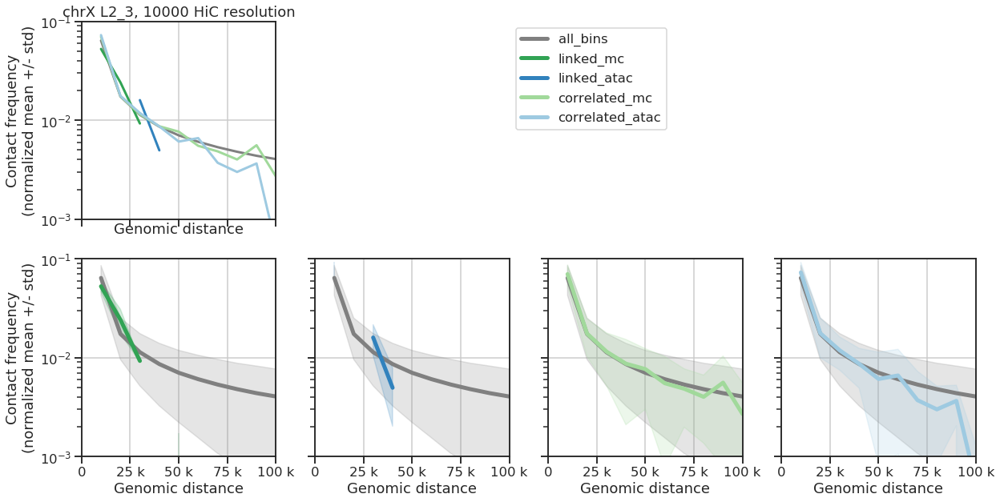

In [24]:
# assuming this enhancer id is the same as the one ethan used
celltype = 'L2_3'
resolution = 10000
chromosome = 'chr1'

for chromosome in chromosomes:
    
    file = '/cndd2/Public_Datasets/m3c_Lee_etal_2019/{}_all_brain.txt_1kb_contacts.mcool'.format(celltype)
    with h5py.File(file) as fh:
        # # # pick one resolution 
        mycooler = cooler.Cooler(fh['resolutions'][str(resolution)])
        mat_all = mycooler.matrix(balance=True).fetch(chromosome)
    
    output_fig = ('/sphere/fangming/enhancers/scripts/figures/'
                  'hic_contact_enrichment{}_{}_{}.pdf'.format(celltype, resolution, chromosome)
                 )

    # distances
    distance_cutoff = 1e6
    distance_idx = np.arange(1, int(distance_cutoff/resolution))
    distances = distance_idx * resolution
    
    enhs = enh_list[enh_list['chr']==chromosome]
    tsss = tss_list[tss_list['chr']==chromosome]

    # get paired bins
    paired_bin_tables = collections.OrderedDict({
        'linked_mc': enh_gene_id_to_binidx(linked_pairs_mc, tsss, enhs, resolution),
        'linked_atac': enh_gene_id_to_binidx(linked_pairs_atac, tsss, enhs, resolution),
        'correlated_mc': enh_gene_id_to_binidx(correlated_pairs_mc, tsss, enhs, resolution),
        'correlated_atac': enh_gene_id_to_binidx(correlated_pairs_atac, tsss, enhs, resolution),
    })
    track_names = list(paired_bin_tables.keys())
    colors = [
        mod_palette_comp['mc'][0],
        mod_palette_comp['atac'][0],
        mod_palette_comp['mc'][2],
        mod_palette_comp['atac'][2],
    ]

    # contact stats
    (contacts_mean, contacts_std,
     contacts_sig_pairs_mean, contacts_sig_pairs_std,
    ) = get_contact_stats(mat_all, paired_bin_tables, resolution, distance_cutoff=1e6)

    # plot
    plot_contact_stats(
        chromosome, celltype, resolution,
        distances, contacts_mean, contacts_std, 
        contacts_sig_pairs_mean, contacts_sig_pairs_std, 
        track_names, colors,
        output_fig,
        )

L2_3


  0%|          | 0/99 [00:00<?, ?it/s]/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1423: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
100%|██████████| 99/99 [00:00<00:00, 401.19it/s]


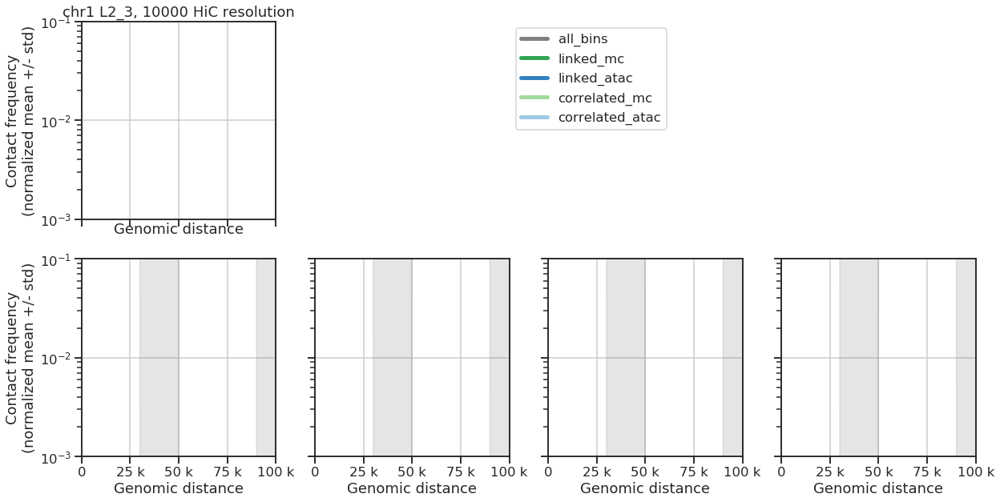

L4


100%|██████████| 99/99 [00:00<00:00, 394.92it/s]


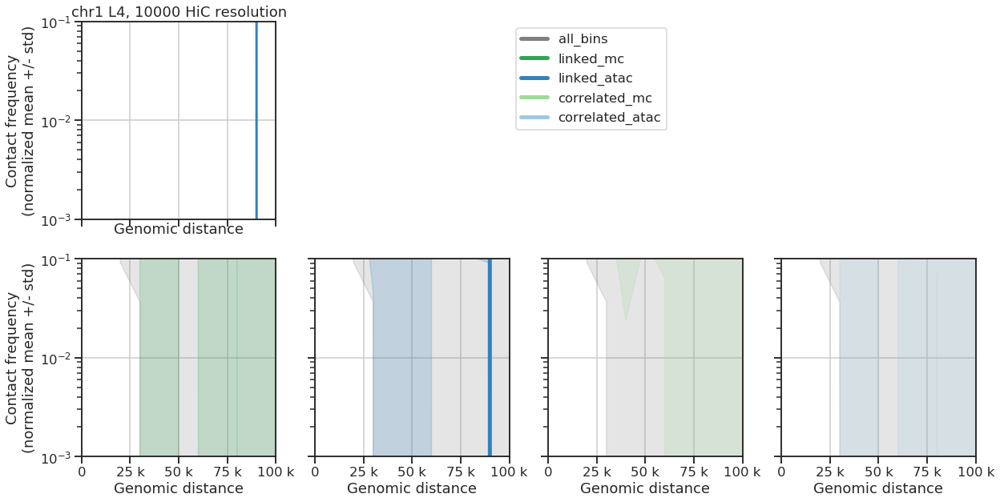

L5


100%|██████████| 99/99 [00:00<00:00, 384.17it/s]


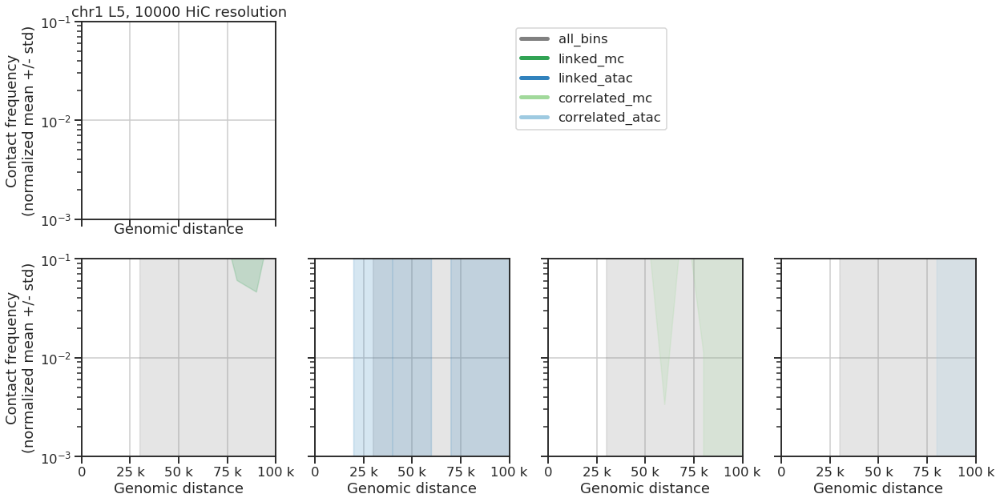

L6


100%|██████████| 99/99 [00:00<00:00, 484.17it/s]


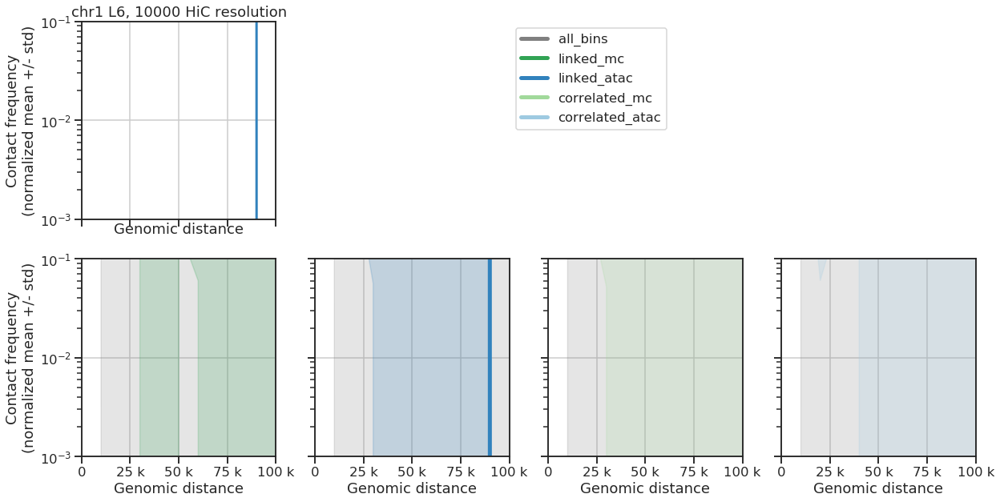

Pvalb


100%|██████████| 99/99 [00:00<00:00, 490.94it/s]


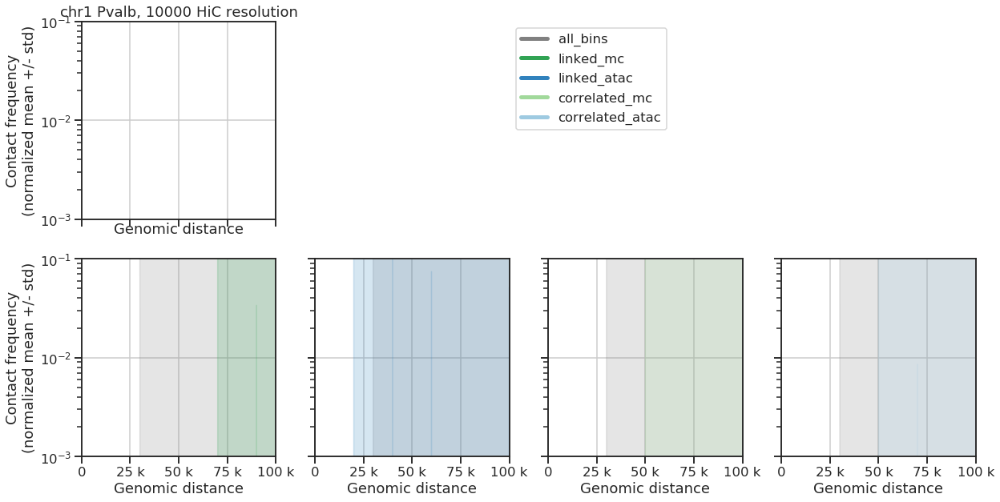

Sst


100%|██████████| 99/99 [00:00<00:00, 485.46it/s]


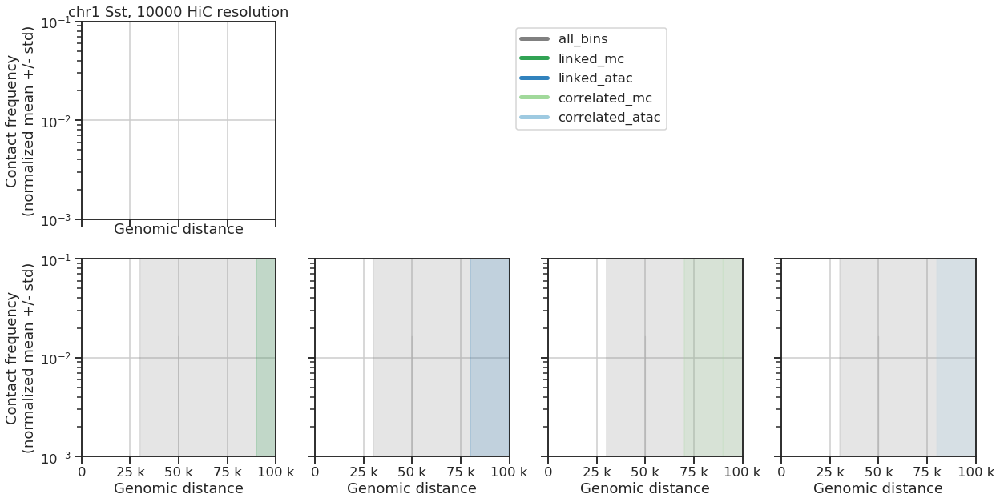

Vip


100%|██████████| 99/99 [00:00<00:00, 478.56it/s]


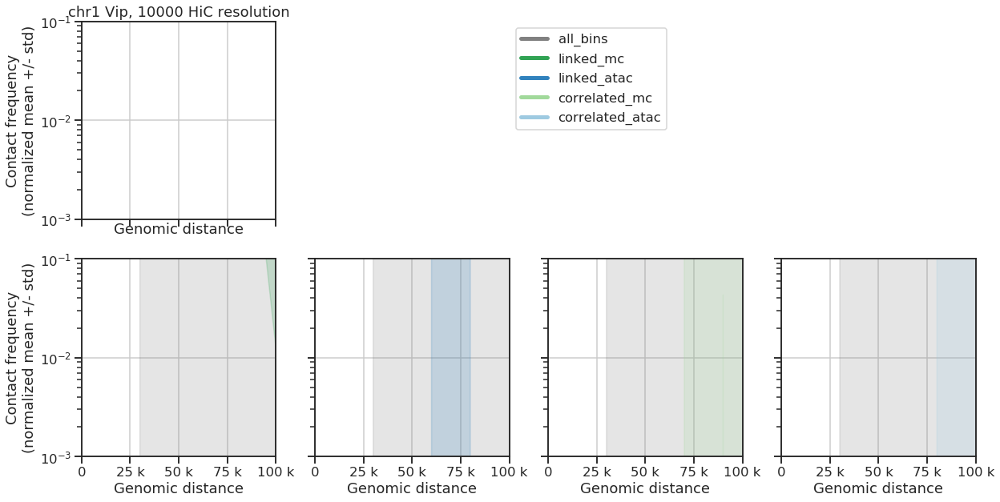

In [29]:
# assuming this enhancer id is the same as the one ethan used
celltype = 'L2_3'
resolution = 10000
chromosome = 'chr1'

for celltype in celltypes:
    print(celltype)
    
    file = '/cndd2/Public_Datasets/m3c_Lee_etal_2019/{}_all_brain.txt_1kb_contacts.mcool'.format(celltype)
    with h5py.File(file) as fh:
        # # # pick one resolution 
        mycooler = cooler.Cooler(fh['resolutions'][str(resolution)])
        mat_all = mycooler.matrix(balance=False).fetch(chromosome)
    
    output_fig = ('/sphere/fangming/enhancers/scripts/figures/'
                  'hic_contact_enrichment{}_{}_{}.pdf'.format(celltype, resolution, chromosome)
                 )

    # distances
    distance_cutoff = 1e6
    distance_idx = np.arange(1, int(distance_cutoff/resolution))
    distances = distance_idx * resolution
    
    enhs = enh_list[enh_list['chr']==chromosome]
    tsss = tss_list[tss_list['chr']==chromosome]

    # get paired bins
    paired_bin_tables = collections.OrderedDict({
        'linked_mc': enh_gene_id_to_binidx(linked_pairs_mc, tsss, enhs, resolution),
        'linked_atac': enh_gene_id_to_binidx(linked_pairs_atac, tsss, enhs, resolution),
        'correlated_mc': enh_gene_id_to_binidx(correlated_pairs_mc, tsss, enhs, resolution),
        'correlated_atac': enh_gene_id_to_binidx(correlated_pairs_atac, tsss, enhs, resolution),
    })
    track_names = list(paired_bin_tables.keys())
    colors = [
        mod_palette_comp['mc'][0],
        mod_palette_comp['atac'][0],
        mod_palette_comp['mc'][2],
        mod_palette_comp['atac'][2],
    ]

    # contact stats
    (contacts_mean, contacts_std,
     contacts_sig_pairs_mean, contacts_sig_pairs_std,
    ) = get_contact_stats(mat_all, paired_bin_tables, resolution, distance_cutoff=1e6)

    # plot
    plot_contact_stats(
        chromosome, celltype, resolution,
        distances, contacts_mean, contacts_std, 
        contacts_sig_pairs_mean, contacts_sig_pairs_std, 
        track_names, colors,
        output_fig,
        )

# Run balance calculation 

In [39]:

# pool = mp.Pool(8)
# for celltype in tqdm.tqdm(celltypes[-1:]):
#     resolution = 10000
# #     for resolution in resolutions:
#     print(celltype, resolution)
    
#     resource_string = (
#          '/cndd2/Public_Datasets/m3c_Lee_etal_2019/{}_all_brain.txt_1kb_contacts.mcool'
#          '::/resolutions/{}'.format(celltype, resolution)
#          )
#     c = cooler.Cooler(resource_string)
#     weights, stats = cooler.balance_cooler(c, map=pool.map, store=True, ignore_diags=3, min_nnz=10)
    
#     # test
#     mat_all = c.matrix(balance=True).fetch(chromosome)
    

  0%|          | 0/1 [00:00<?, ?it/s]

Ndnf 10000


100%|██████████| 1/1 [02:11<00:00, 131.73s/it]


#  Run all results - then summarize the stats

In [14]:
# enhancers lifted
f = './hic_from_ethan/enhancers_lifted.bed'
enh_list = pd.read_csv(f, sep='\t', header=None, names=['chr', 'start', 'end', 'enh_id'])
enh_list['center'] = (enh_list['start'] + enh_list['end'])/2
print(enh_list.shape)
enh_list.head()

# tss lifted
f = './hic_from_ethan/tss_lifted.bed'
tss_list = pd.read_csv(f, sep='\t', header=None, names=['chr', 'start', 'end', 'gid'])
print(tss_list.shape)
tss_list.head()

# enh - tss linked list

# orig significant pairs (enh_index and gid)

# load some results
f = '/sphere/fangming/enhancers/scripts/results_new/fig2_201027_linked_pairs_mc.tsv'
linked_pairs_mc = pd.read_csv(f, sep="\t")
print(linked_pairs_mc.shape)

f = '/sphere/fangming/enhancers/scripts/results_new/fig2_201027_linked_pairs_atac.tsv'
linked_pairs_atac = pd.read_csv(f, sep="\t")
print(linked_pairs_atac.shape)

f = '/sphere/fangming/enhancers/scripts/results_new/fig2_201027_correlated_pairs_mc.tsv'
correlated_pairs_mc = pd.read_csv(f, sep="\t")
print(correlated_pairs_mc.shape)

f = '/sphere/fangming/enhancers/scripts/results_new/fig2_201027_correlated_pairs_atac.tsv'
correlated_pairs_atac = pd.read_csv(f, sep="\t")
print(correlated_pairs_atac.shape)

linked_pairs_mc.head()

(126134, 5)
(33814, 4)
(7455, 3)
(3879, 3)
(85596, 3)
(50012, 3)


,gene,enh,dist
0,ENSMUSG00000000058,181997,14555
1,ENSMUSG00000000088,221978,48225
2,ENSMUSG00000000126,35942,90017
3,ENSMUSG00000000126,35953,4552
4,ENSMUSG00000000126,35954,5567


['L2_3', 'L4', 'L5', 'L6', 'Pvalb', 'Sst', 'Vip', 'Ndnf']
['chr1', 'chr2', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7', 'chr8', 'chr9', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 'chr19', 'chr20', 'chr21', 'chr22', 'chrX']
Ndnf 10000 chr1


  0%|          | 0/99 [00:00<?, ?it/s]

(24926, 24926)


/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1423: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
100%|██████████| 99/99 [00:00<00:00, 422.24it/s]


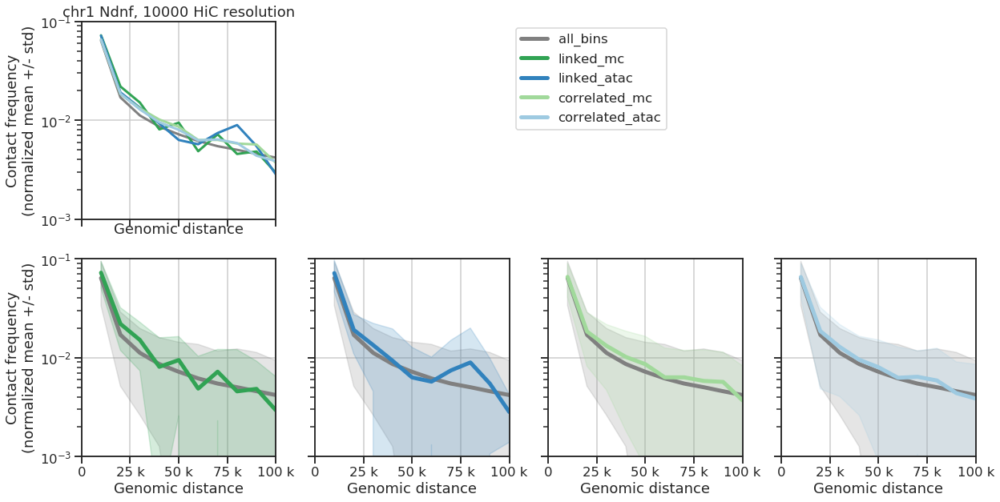

Ndnf 10000 chr2


 23%|██▎       | 23/99 [00:00<00:00, 227.69it/s]

(24320, 24320)


100%|██████████| 99/99 [00:00<00:00, 340.30it/s]


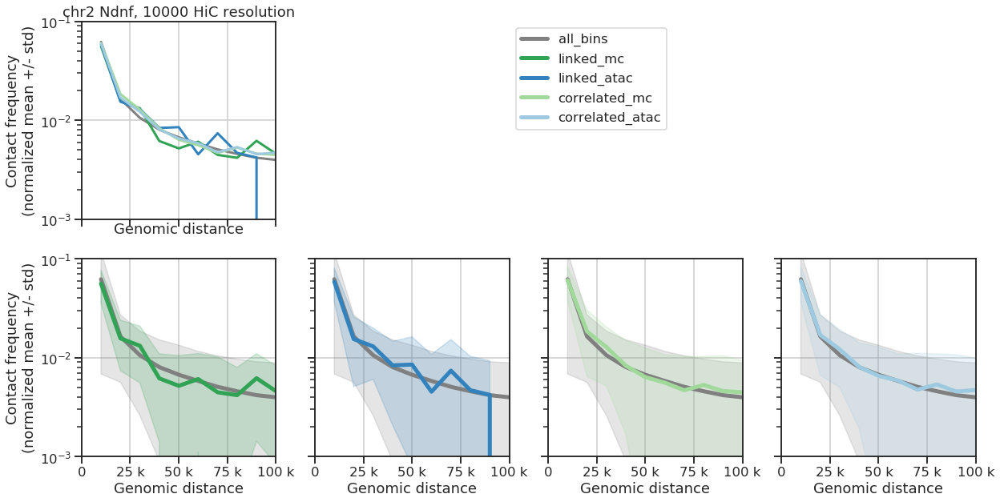

Ndnf 10000 chr3


 38%|███▊      | 38/99 [00:00<00:00, 377.45it/s]

(19803, 19803)


100%|██████████| 99/99 [00:00<00:00, 467.88it/s]


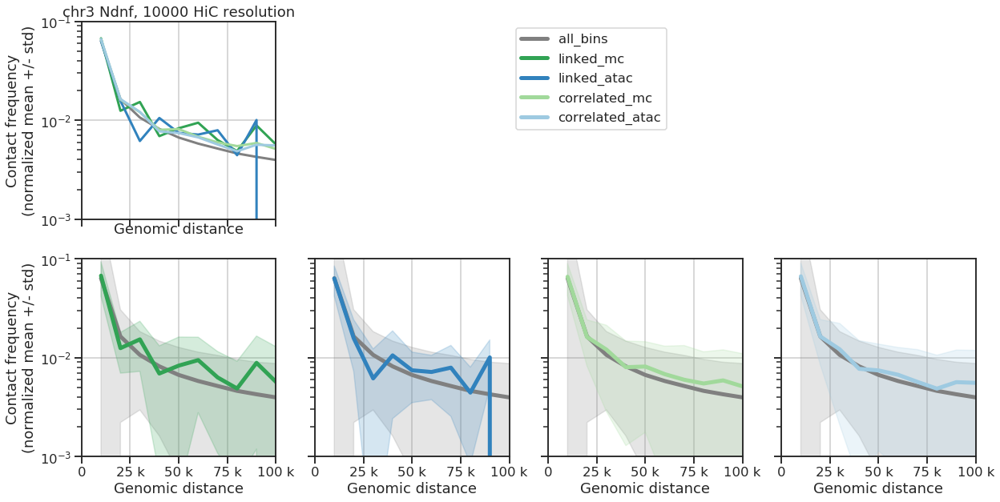

Ndnf 10000 chr4


  0%|          | 0/99 [00:00<?, ?it/s]

(19116, 19116)


100%|██████████| 99/99 [00:00<00:00, 501.35it/s]


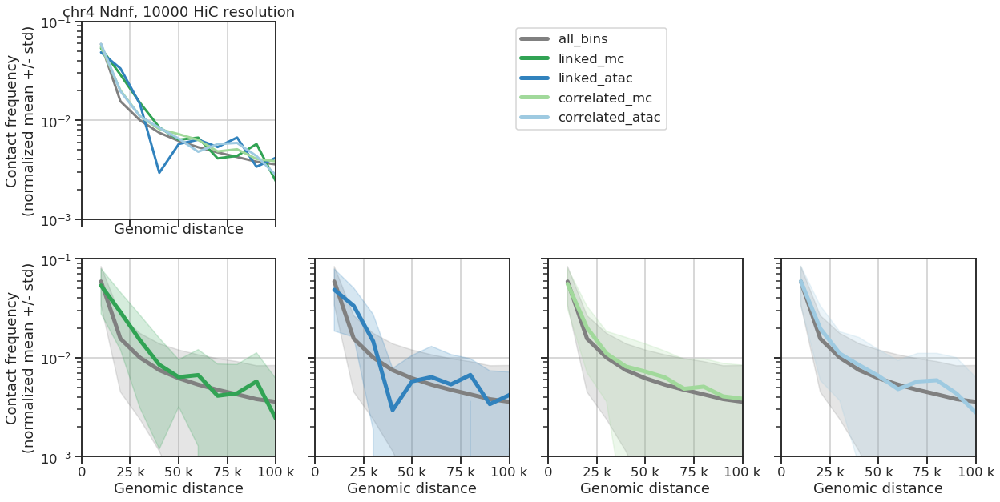

Ndnf 10000 chr5


 53%|█████▎    | 52/99 [00:00<00:00, 515.71it/s]

(18092, 18092)


100%|██████████| 99/99 [00:00<00:00, 594.68it/s]


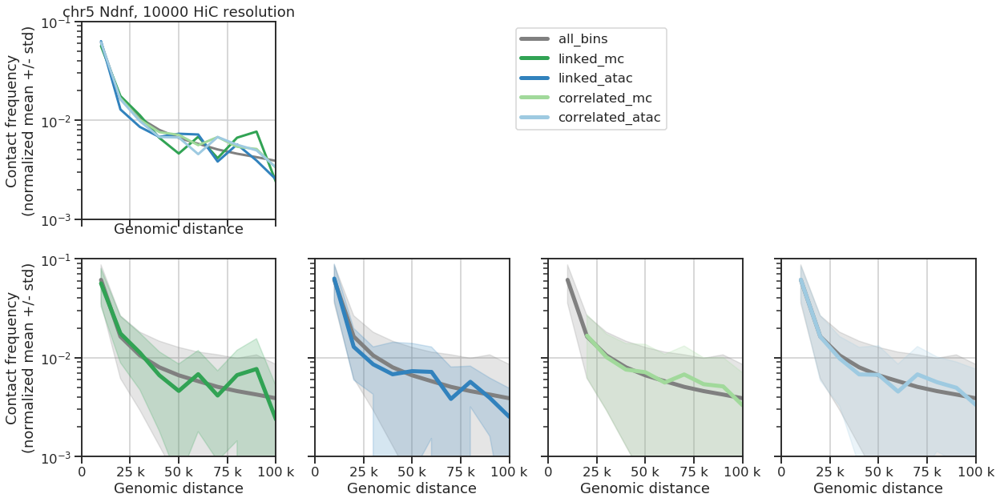

Ndnf 10000 chr6


 45%|████▌     | 45/99 [00:00<00:00, 446.78it/s]

(17112, 17112)


100%|██████████| 99/99 [00:00<00:00, 556.96it/s]


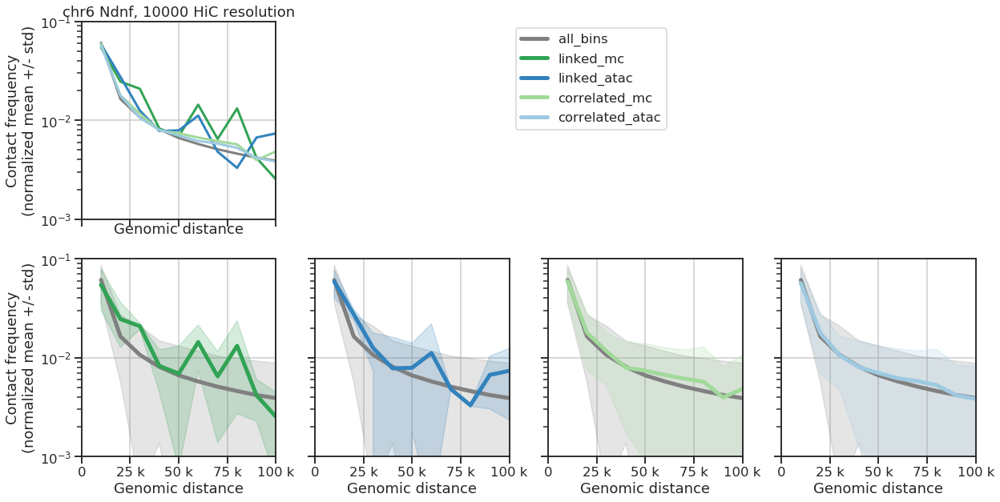

Ndnf 10000 chr7


 47%|████▋     | 47/99 [00:00<00:00, 469.62it/s]

(15914, 15914)


100%|██████████| 99/99 [00:00<00:00, 581.79it/s]


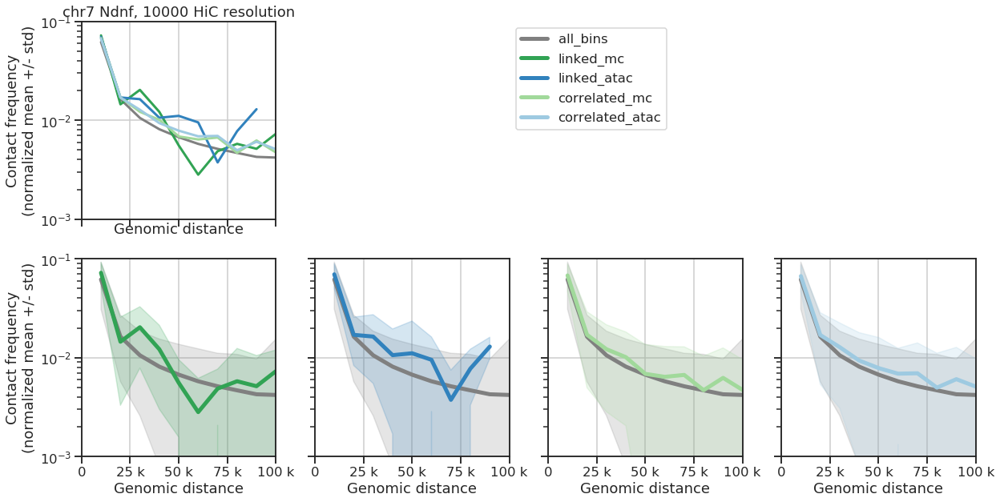

Ndnf 10000 chr8


 21%|██        | 21/99 [00:00<00:00, 206.49it/s]

(14637, 14637)


100%|██████████| 99/99 [00:00<00:00, 439.97it/s]


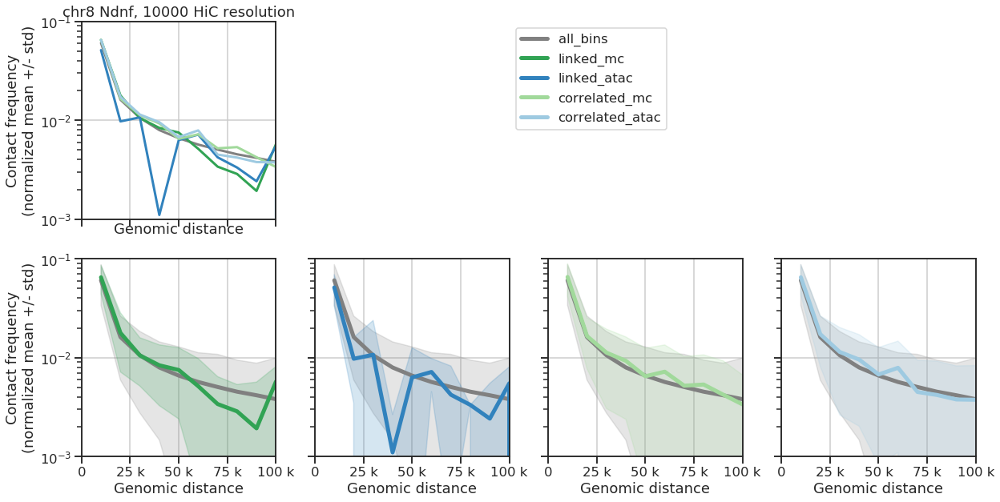

Ndnf 10000 chr9


 54%|█████▎    | 53/99 [00:00<00:00, 523.93it/s]

(14122, 14122)


100%|██████████| 99/99 [00:00<00:00, 622.06it/s]


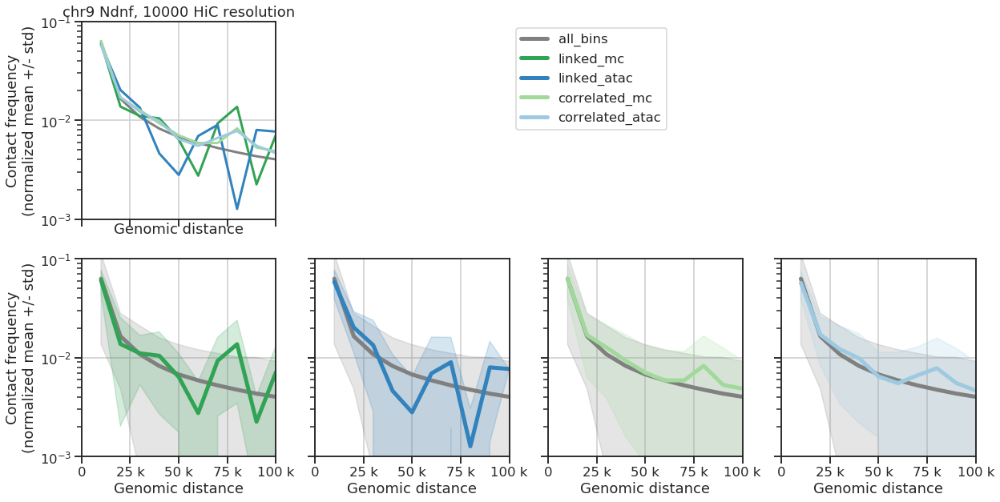

Ndnf 10000 chr10


 55%|█████▍    | 54/99 [00:00<00:00, 537.43it/s]

(13554, 13554)


100%|██████████| 99/99 [00:00<00:00, 632.37it/s]


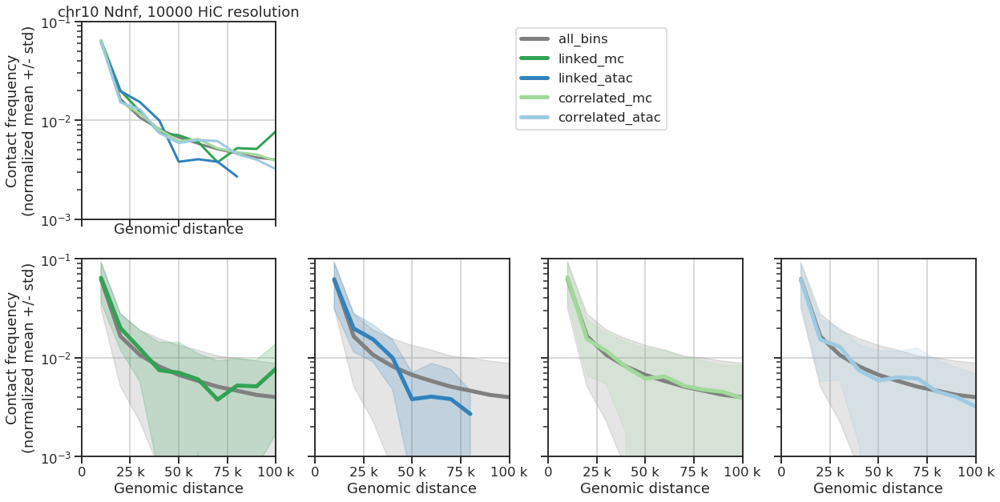

Ndnf 10000 chr11


 54%|█████▎    | 53/99 [00:00<00:00, 526.38it/s]

(13501, 13501)


100%|██████████| 99/99 [00:00<00:00, 625.31it/s]


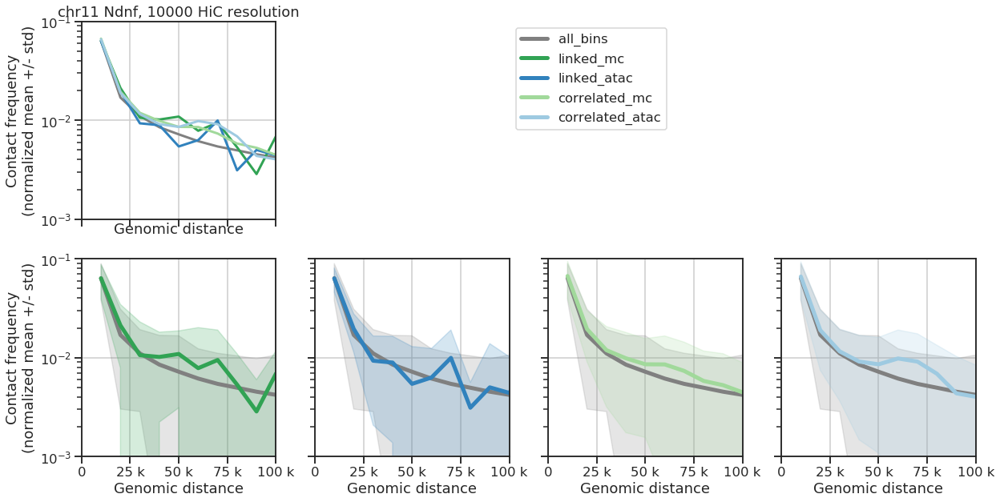

Ndnf 10000 chr12


 46%|████▋     | 46/99 [00:00<00:00, 460.00it/s]

(13386, 13386)


100%|██████████| 99/99 [00:00<00:00, 585.80it/s]


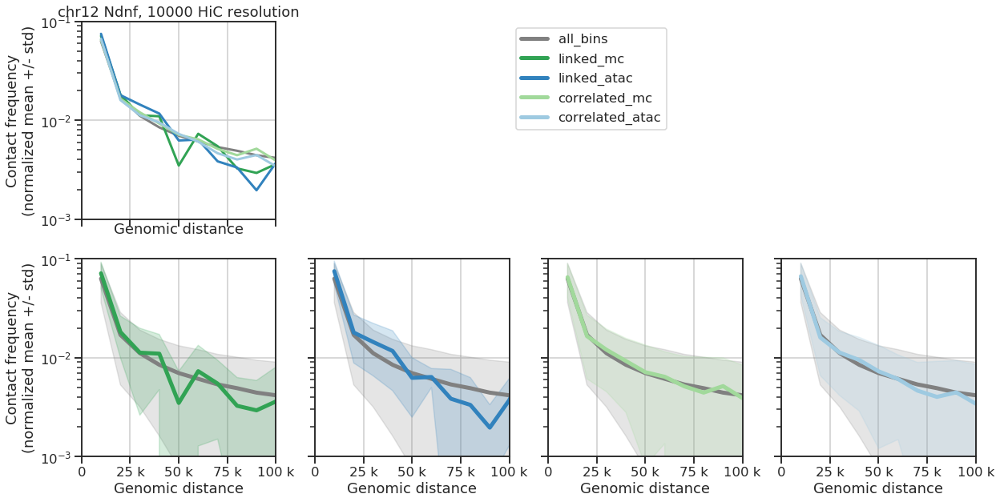

Ndnf 10000 chr13


 25%|██▌       | 25/99 [00:00<00:00, 247.65it/s]

(11517, 11517)


100%|██████████| 99/99 [00:00<00:00, 479.14it/s]


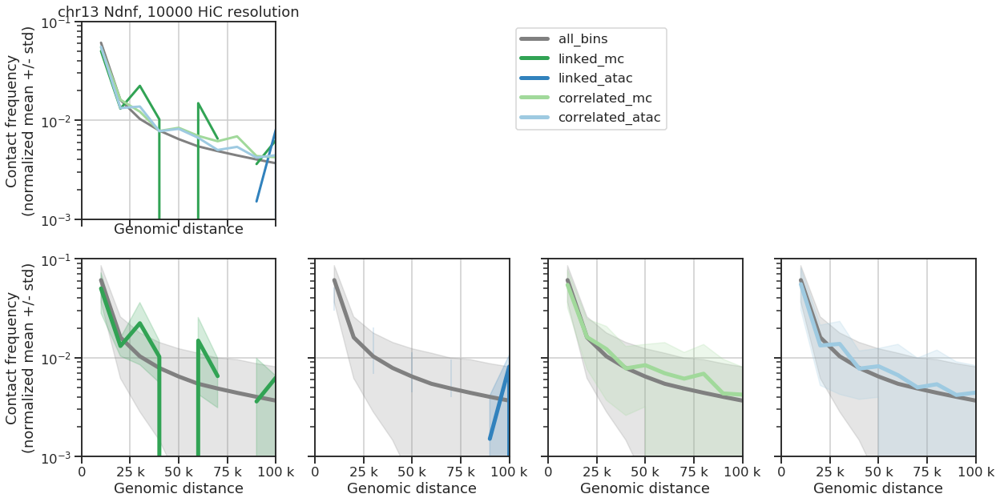

Ndnf 10000 chr14


100%|██████████| 99/99 [00:00<00:00, 730.90it/s]

(10735, 10735)


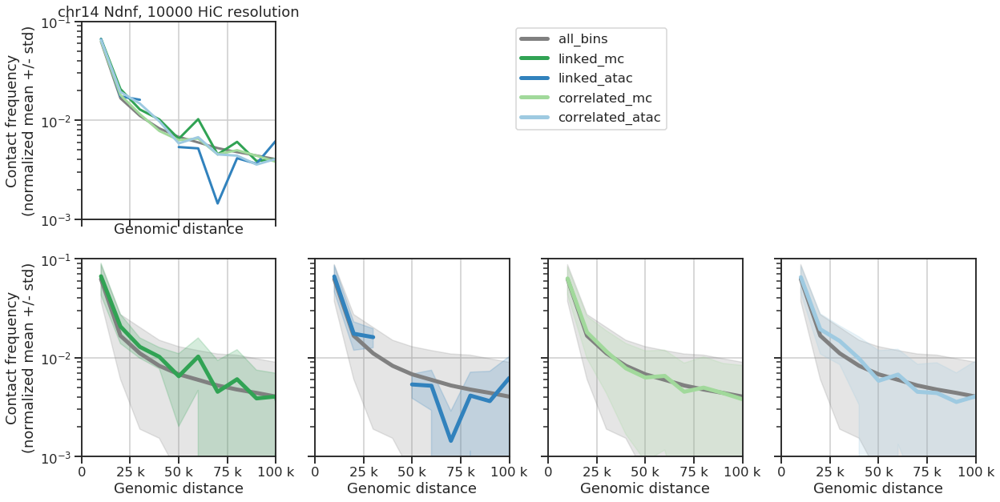

Ndnf 10000 chr15


100%|██████████| 99/99 [00:00<00:00, 713.95it/s]

(10254, 10254)


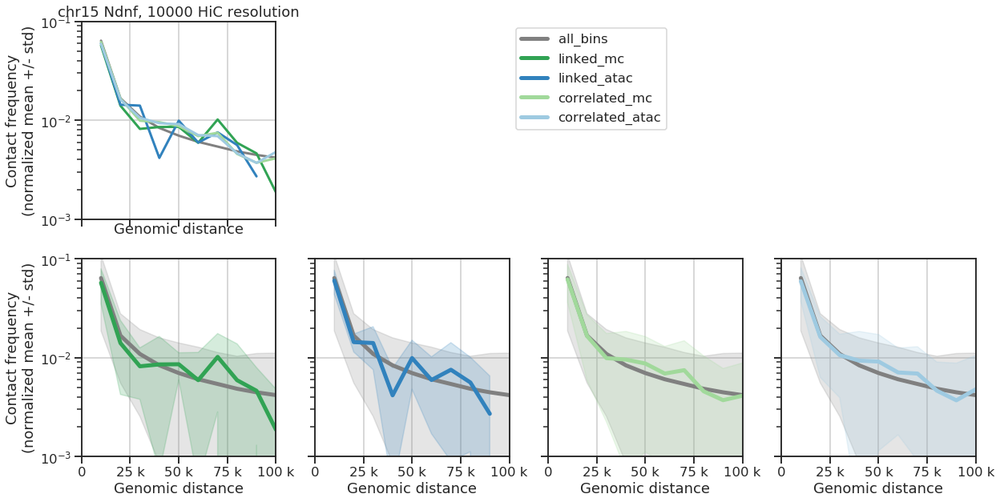

Ndnf 10000 chr16


 63%|██████▎   | 62/99 [00:00<00:00, 616.38it/s]

(9036, 9036)


100%|██████████| 99/99 [00:00<00:00, 701.11it/s]


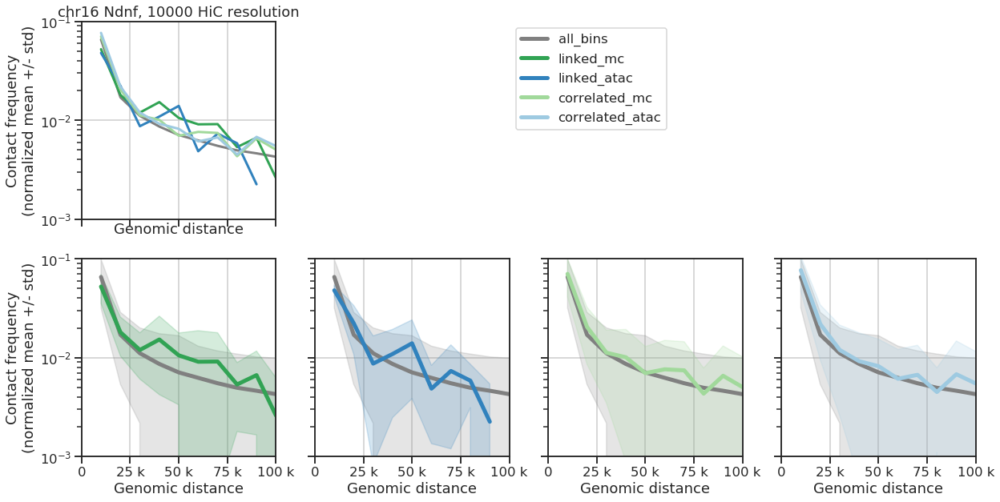

Ndnf 10000 chr17


100%|██████████| 99/99 [00:00<00:00, 708.57it/s]

(8120, 8120)


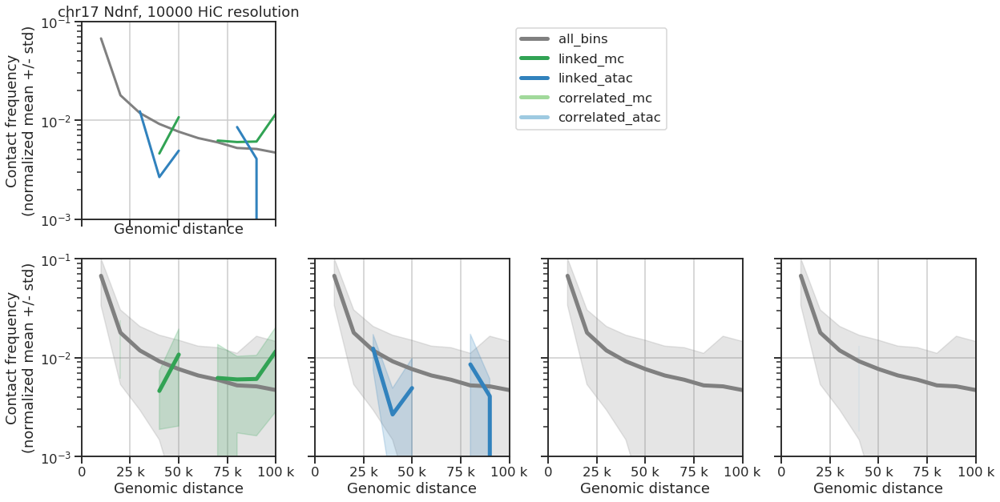

Ndnf 10000 chr18


 53%|█████▎    | 52/99 [00:00<00:00, 515.07it/s]

(7808, 7808)


100%|██████████| 99/99 [00:00<00:00, 649.77it/s]


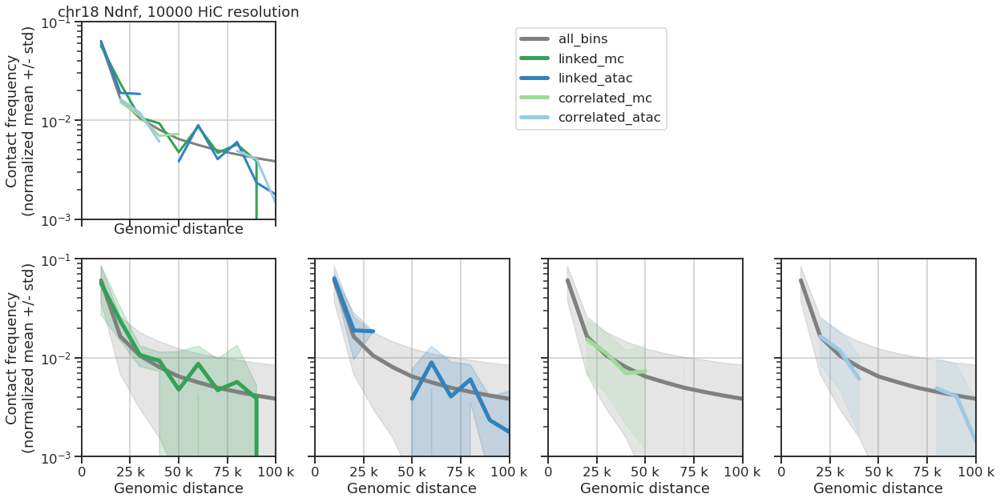

Ndnf 10000 chr19


100%|██████████| 99/99 [00:00<00:00, 828.72it/s]

(5913, 5913)


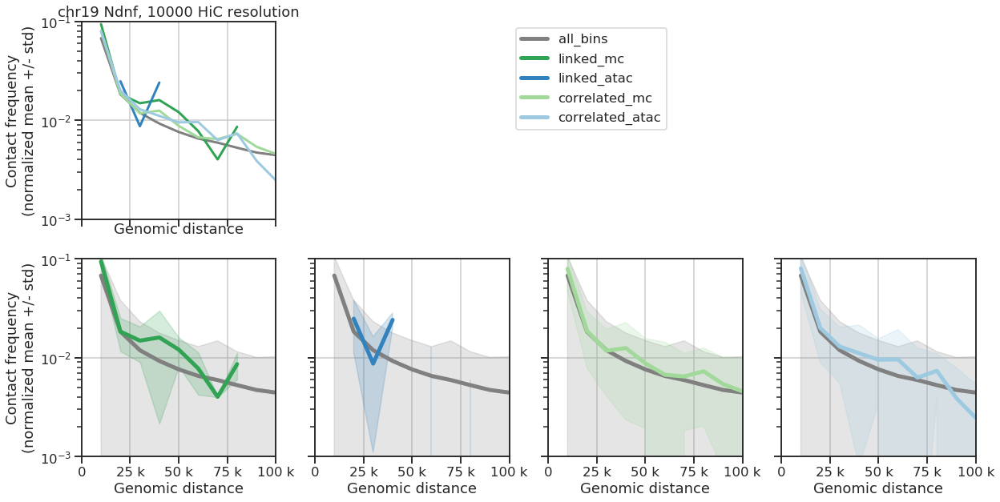

Ndnf 10000 chr20


100%|██████████| 99/99 [00:00<00:00, 769.04it/s]

(6303, 6303)


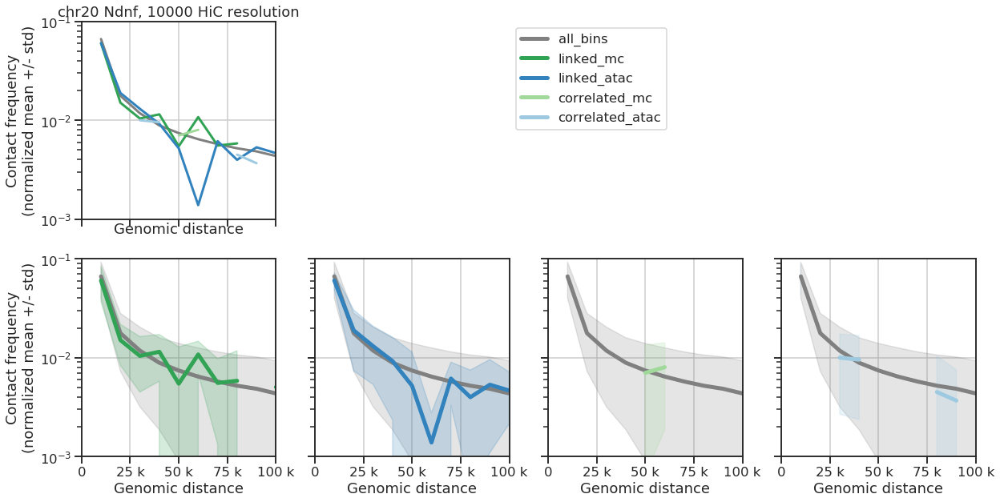

Ndnf 10000 chr21


100%|██████████| 99/99 [00:00<00:00, 954.39it/s]

(4813, 4813)


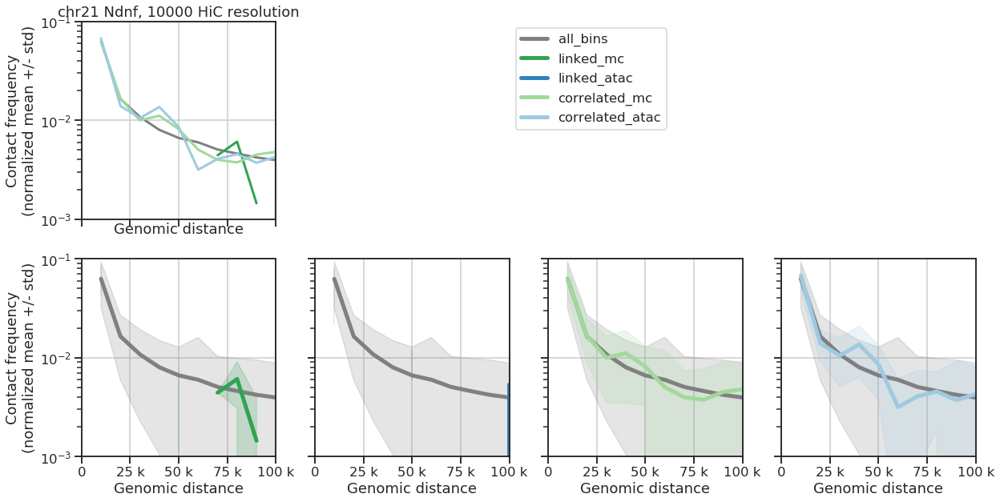

Ndnf 10000 chr22


100%|██████████| 99/99 [00:00<00:00, 846.59it/s]

(5131, 5131)


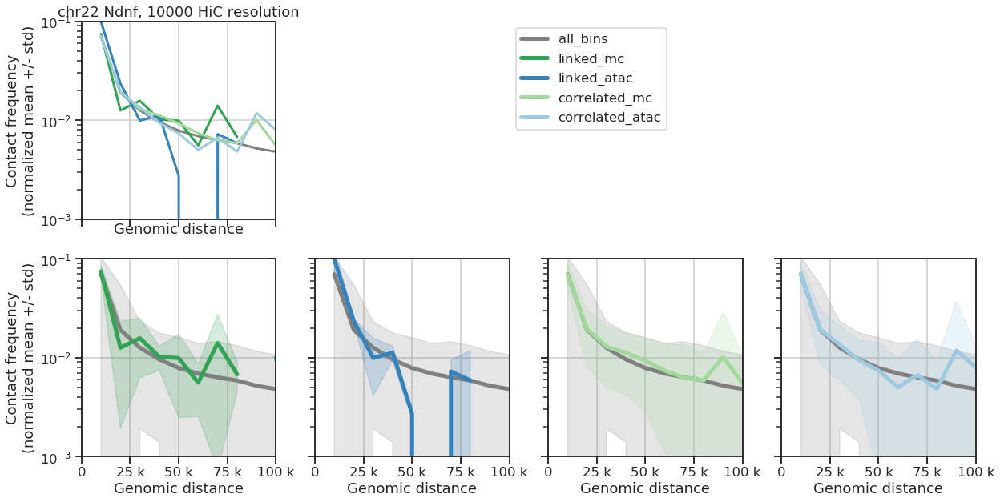

Ndnf 10000 chrX


 61%|██████    | 60/99 [00:00<00:00, 594.89it/s]

(15528, 15528)


100%|██████████| 99/99 [00:00<00:00, 631.28it/s]


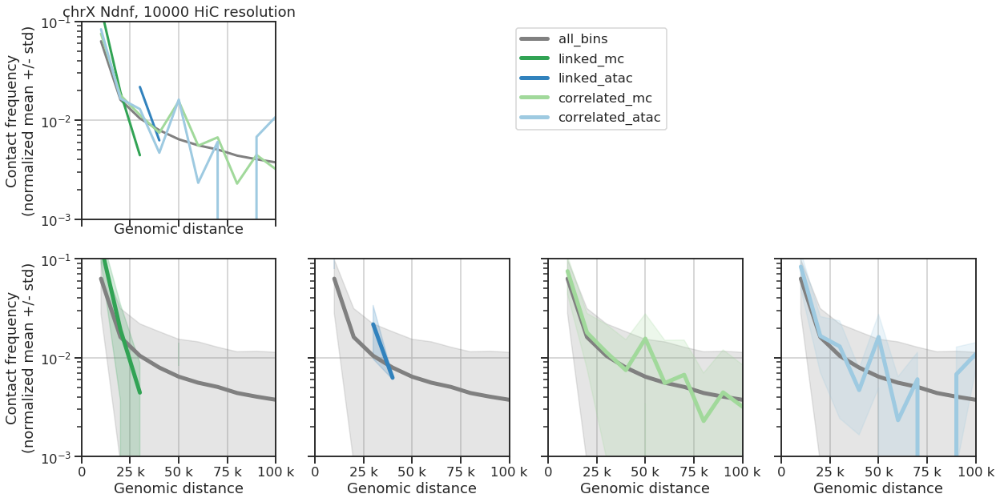

In [40]:
# test if it runs through

print(celltypes)
print(chromosomes)
resolution = 10000
for celltype in celltypes[-1:]:
    for chromosome in chromosomes:
        print(celltype, resolution, chromosome)
        
        # 
        resource_string = (
             '/cndd2/Public_Datasets/m3c_Lee_etal_2019/{}_all_brain.txt_1kb_contacts.mcool'
             '::/resolutions/{}'.format(celltype, resolution)
             )
        c = cooler.Cooler(resource_string)
        mat_all = c.matrix(balance=True).fetch(chromosome)
        print(mat_all.shape)
        
        # run and save results
        output_fig = ('/sphere/fangming/enhancers/scripts/figures/'
                      'hic_contact_enrichment_{}_{}_{}.pdf'.format(celltype, resolution, chromosome)
                     )
        output_res = ('/sphere/fangming/enhancers/scripts/results_new/'
                      'hic_contact_enrichment_{}_{}_{}.pkl'.format(celltype, resolution, chromosome)
                     )

        # distances
        distance_cutoff = 1e6
        distance_idx = np.arange(1, int(distance_cutoff/resolution))
        distances = distance_idx * resolution

        enhs = enh_list[enh_list['chr']==chromosome]
        tsss = tss_list[tss_list['chr']==chromosome]

        # get paired bins
        paired_bin_tables = collections.OrderedDict({
            'linked_mc': enh_gene_id_to_binidx(linked_pairs_mc, tsss, enhs, resolution),
            'linked_atac': enh_gene_id_to_binidx(linked_pairs_atac, tsss, enhs, resolution),
            'correlated_mc': enh_gene_id_to_binidx(correlated_pairs_mc, tsss, enhs, resolution),
            'correlated_atac': enh_gene_id_to_binidx(correlated_pairs_atac, tsss, enhs, resolution),
        })
        track_names = list(paired_bin_tables.keys())
        colors = [
            mod_palette_comp['mc'][0],
            mod_palette_comp['atac'][0],
            mod_palette_comp['mc'][2],
            mod_palette_comp['atac'][2],
        ]

        # contact stats
        (contacts_mean, contacts_std,
         contacts_sig_pairs_mean, contacts_sig_pairs_std,
        ) = get_contact_stats(mat_all, paired_bin_tables, resolution, distance_cutoff=1e6)
        
        
        # save results
        # distances, contacts_mean, contacts_std ## these are numpy arrays 
        # contacts_sig_pairs_mean, contacts_sig_pairs_std ## these
        with open(output_res, 'wb') as fwh:
            pickle.dump((distances, contacts_mean, contacts_std,
                         contacts_sig_pairs_mean, contacts_sig_pairs_std,
                        ), fwh)

        # plot
        plot_contact_stats(
            chromosome, celltype, resolution,
            distances, contacts_mean, contacts_std, 
            contacts_sig_pairs_mean, contacts_sig_pairs_std, 
            track_names, colors,
            output_fig,
            )
        

# Combine all chromosomes 
- null distributions are very close to each other; combine
- combine sig pairs too

In [123]:
distance_cutoff = 1e5
distance_idx = np.arange(1, int(distance_cutoff/resolution)+1)
distances = distance_idx * resolution

print(len(distance_idx), len(distances))

10 10


L2_3
L2_3 10000 chr1


100%|██████████| 10/10 [00:00<00:00, 229.74it/s]


L2_3 10000 chr2


100%|██████████| 10/10 [00:00<00:00, 317.77it/s]


L2_3 10000 chr3


100%|██████████| 10/10 [00:00<00:00, 345.65it/s]


L2_3 10000 chr4


100%|██████████| 10/10 [00:00<00:00, 393.39it/s]


L2_3 10000 chr5


100%|██████████| 10/10 [00:00<00:00, 380.84it/s]


L2_3 10000 chr6


100%|██████████| 10/10 [00:00<00:00, 411.48it/s]


L2_3 10000 chr7


100%|██████████| 10/10 [00:00<00:00, 428.98it/s]


L2_3 10000 chr8


100%|██████████| 10/10 [00:00<00:00, 425.57it/s]


L2_3 10000 chr9


100%|██████████| 10/10 [00:00<00:00, 433.15it/s]


L2_3 10000 chr10


100%|██████████| 10/10 [00:00<00:00, 445.27it/s]


L2_3 10000 chr11


100%|██████████| 10/10 [00:00<00:00, 396.63it/s]


L2_3 10000 chr12


100%|██████████| 10/10 [00:00<00:00, 423.97it/s]


L2_3 10000 chr13


100%|██████████| 10/10 [00:00<00:00, 515.74it/s]


L2_3 10000 chr14


100%|██████████| 10/10 [00:00<00:00, 461.61it/s]


L2_3 10000 chr15


100%|██████████| 10/10 [00:00<00:00, 476.35it/s]


L2_3 10000 chr16


100%|██████████| 10/10 [00:00<00:00, 498.70it/s]


L2_3 10000 chr17


100%|██████████| 10/10 [00:00<00:00, 469.41it/s]


L2_3 10000 chr18


100%|██████████| 10/10 [00:00<00:00, 519.86it/s]


L2_3 10000 chr19


100%|██████████| 10/10 [00:00<00:00, 548.08it/s]


L2_3 10000 chr20


100%|██████████| 10/10 [00:00<00:00, 507.07it/s]


L2_3 10000 chr21


100%|██████████| 10/10 [00:00<00:00, 672.21it/s]


L2_3 10000 chr22


100%|██████████| 10/10 [00:00<00:00, 544.43it/s]


L2_3 10000 chrX


100%|██████████| 10/10 [00:00<00:00, 544.17it/s]


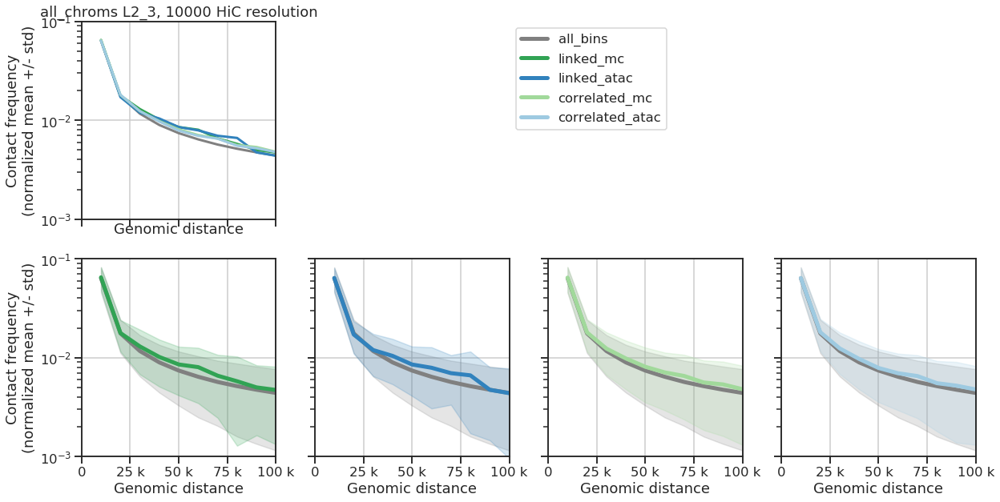

L4
L4 10000 chr1


100%|██████████| 10/10 [00:00<00:00, 199.30it/s]


L4 10000 chr2


100%|██████████| 10/10 [00:00<00:00, 338.77it/s]


L4 10000 chr3


100%|██████████| 10/10 [00:00<00:00, 365.79it/s]


L4 10000 chr4


100%|██████████| 10/10 [00:00<00:00, 396.52it/s]


L4 10000 chr5


100%|██████████| 10/10 [00:00<00:00, 386.22it/s]


L4 10000 chr6


100%|██████████| 10/10 [00:00<00:00, 401.18it/s]


L4 10000 chr7


100%|██████████| 10/10 [00:00<00:00, 412.20it/s]


L4 10000 chr8


100%|██████████| 10/10 [00:00<00:00, 434.06it/s]


L4 10000 chr9


100%|██████████| 10/10 [00:00<00:00, 426.69it/s]


L4 10000 chr10


100%|██████████| 10/10 [00:00<00:00, 442.97it/s]


L4 10000 chr11


100%|██████████| 10/10 [00:00<00:00, 421.49it/s]


L4 10000 chr12


100%|██████████| 10/10 [00:00<00:00, 410.30it/s]


L4 10000 chr13


100%|██████████| 10/10 [00:00<00:00, 515.27it/s]


L4 10000 chr14


100%|██████████| 10/10 [00:00<00:00, 475.46it/s]


L4 10000 chr15


100%|██████████| 10/10 [00:00<00:00, 470.80it/s]


L4 10000 chr16


100%|██████████| 10/10 [00:00<00:00, 493.17it/s]


L4 10000 chr17


100%|██████████| 10/10 [00:00<00:00, 472.91it/s]


L4 10000 chr18


100%|██████████| 10/10 [00:00<00:00, 503.91it/s]


L4 10000 chr19


100%|██████████| 10/10 [00:00<00:00, 584.23it/s]


L4 10000 chr20


100%|██████████| 10/10 [00:00<00:00, 507.74it/s]


L4 10000 chr21


100%|██████████| 10/10 [00:00<00:00, 661.70it/s]


L4 10000 chr22


100%|██████████| 10/10 [00:00<00:00, 544.75it/s]


L4 10000 chrX


100%|██████████| 10/10 [00:00<00:00, 554.52it/s]


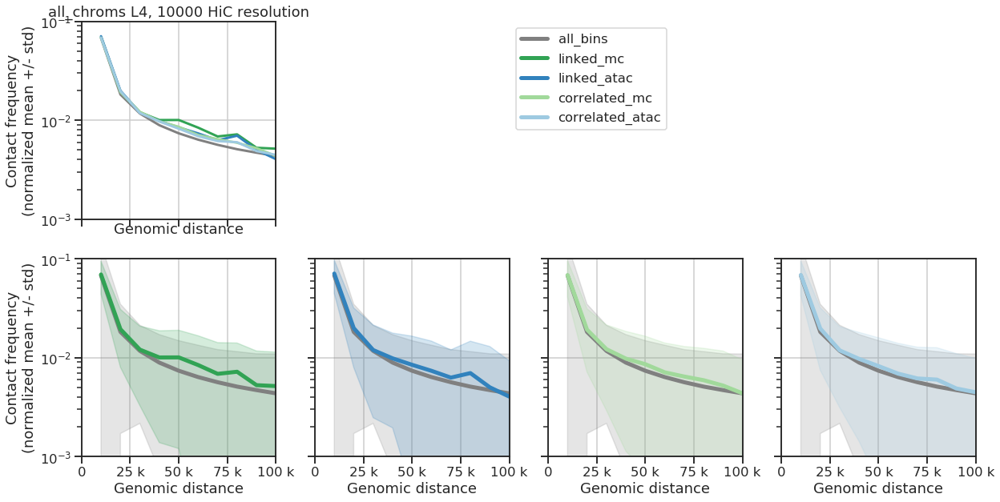

L5
L5 10000 chr1


100%|██████████| 10/10 [00:00<00:00, 330.38it/s]


L5 10000 chr2


100%|██████████| 10/10 [00:00<00:00, 153.81it/s]


L5 10000 chr3


100%|██████████| 10/10 [00:00<00:00, 340.53it/s]


L5 10000 chr4


100%|██████████| 10/10 [00:00<00:00, 395.08it/s]


L5 10000 chr5


100%|██████████| 10/10 [00:00<00:00, 353.37it/s]


L5 10000 chr6


100%|██████████| 10/10 [00:00<00:00, 413.24it/s]


L5 10000 chr7


100%|██████████| 10/10 [00:00<00:00, 410.10it/s]


L5 10000 chr8


100%|██████████| 10/10 [00:00<00:00, 433.37it/s]


L5 10000 chr9


100%|██████████| 10/10 [00:00<00:00, 425.05it/s]


L5 10000 chr10


100%|██████████| 10/10 [00:00<00:00, 443.59it/s]


L5 10000 chr11


100%|██████████| 10/10 [00:00<00:00, 413.45it/s]


L5 10000 chr12


100%|██████████| 10/10 [00:00<00:00, 408.07it/s]


L5 10000 chr13


100%|██████████| 10/10 [00:00<00:00, 516.03it/s]


L5 10000 chr14


100%|██████████| 10/10 [00:00<00:00, 466.55it/s]


L5 10000 chr15


100%|██████████| 10/10 [00:00<00:00, 472.32it/s]


L5 10000 chr16


100%|██████████| 10/10 [00:00<00:00, 495.47it/s]


L5 10000 chr17


100%|██████████| 10/10 [00:00<00:00, 457.47it/s]


L5 10000 chr18


100%|██████████| 10/10 [00:00<00:00, 510.44it/s]


L5 10000 chr19


100%|██████████| 10/10 [00:00<00:00, 586.70it/s]


L5 10000 chr20


100%|██████████| 10/10 [00:00<00:00, 495.94it/s]


L5 10000 chr21


100%|██████████| 10/10 [00:00<00:00, 665.14it/s]


L5 10000 chr22


100%|██████████| 10/10 [00:00<00:00, 545.59it/s]


L5 10000 chrX


100%|██████████| 10/10 [00:00<00:00, 548.07it/s]


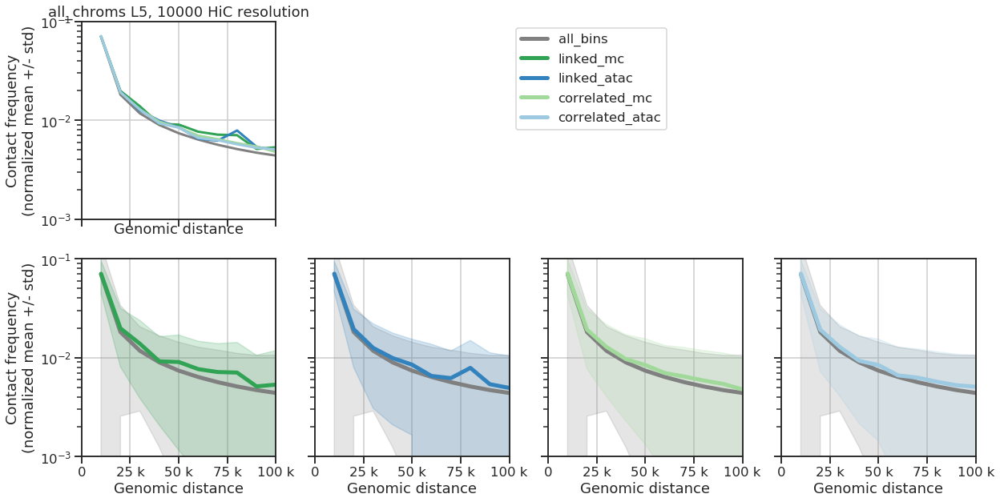

L6
L6 10000 chr1


100%|██████████| 10/10 [00:00<00:00, 333.23it/s]


L6 10000 chr2


100%|██████████| 10/10 [00:00<00:00, 276.24it/s]


L6 10000 chr3


100%|██████████| 10/10 [00:00<00:00, 175.07it/s]


L6 10000 chr4


100%|██████████| 10/10 [00:00<00:00, 186.26it/s]


L6 10000 chr5


100%|██████████| 10/10 [00:00<00:00, 383.13it/s]


L6 10000 chr6


100%|██████████| 10/10 [00:00<00:00, 398.92it/s]


L6 10000 chr7


100%|██████████| 10/10 [00:00<00:00, 426.26it/s]


L6 10000 chr8


100%|██████████| 10/10 [00:00<00:00, 418.33it/s]


L6 10000 chr9


100%|██████████| 10/10 [00:00<00:00, 434.95it/s]


L6 10000 chr10


100%|██████████| 10/10 [00:00<00:00, 437.70it/s]


L6 10000 chr11


100%|██████████| 10/10 [00:00<00:00, 412.35it/s]


L6 10000 chr12


100%|██████████| 10/10 [00:00<00:00, 422.83it/s]


L6 10000 chr13


100%|██████████| 10/10 [00:00<00:00, 230.02it/s]


L6 10000 chr14


100%|██████████| 10/10 [00:00<00:00, 381.43it/s]


L6 10000 chr15


100%|██████████| 10/10 [00:00<00:00, 477.97it/s]


L6 10000 chr16


100%|██████████| 10/10 [00:00<00:00, 497.18it/s]


L6 10000 chr17


100%|██████████| 10/10 [00:00<00:00, 473.54it/s]


L6 10000 chr18


100%|██████████| 10/10 [00:00<00:00, 505.59it/s]


L6 10000 chr19


100%|██████████| 10/10 [00:00<00:00, 587.75it/s]


L6 10000 chr20


100%|██████████| 10/10 [00:00<00:00, 509.79it/s]


L6 10000 chr21


100%|██████████| 10/10 [00:00<00:00, 674.62it/s]


L6 10000 chr22


100%|██████████| 10/10 [00:00<00:00, 540.13it/s]


L6 10000 chrX


100%|██████████| 10/10 [00:00<00:00, 563.15it/s]


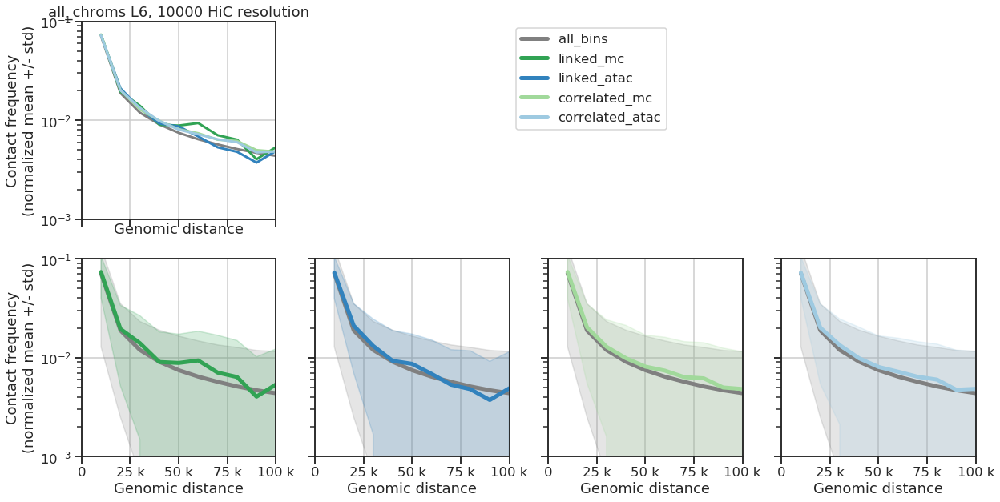

Pvalb
Pvalb 10000 chr1


100%|██████████| 10/10 [00:00<00:00, 262.54it/s]


Pvalb 10000 chr2


100%|██████████| 10/10 [00:00<00:00, 349.56it/s]


Pvalb 10000 chr3


100%|██████████| 10/10 [00:00<00:00, 163.38it/s]


Pvalb 10000 chr4


100%|██████████| 10/10 [00:00<00:00, 393.75it/s]


Pvalb 10000 chr5


100%|██████████| 10/10 [00:00<00:00, 351.70it/s]


Pvalb 10000 chr6


100%|██████████| 10/10 [00:00<00:00, 395.54it/s]


Pvalb 10000 chr7


100%|██████████| 10/10 [00:00<00:00, 423.83it/s]


Pvalb 10000 chr8


100%|██████████| 10/10 [00:00<00:00, 417.81it/s]


Pvalb 10000 chr9


100%|██████████| 10/10 [00:00<00:00, 436.06it/s]


Pvalb 10000 chr10


100%|██████████| 10/10 [00:00<00:00, 420.55it/s]


Pvalb 10000 chr11


100%|██████████| 10/10 [00:00<00:00, 395.73it/s]


Pvalb 10000 chr12


100%|██████████| 10/10 [00:00<00:00, 422.54it/s]


Pvalb 10000 chr13


100%|██████████| 10/10 [00:00<00:00, 517.24it/s]


Pvalb 10000 chr14


100%|██████████| 10/10 [00:00<00:00, 408.83it/s]


Pvalb 10000 chr15


100%|██████████| 10/10 [00:00<00:00, 441.95it/s]


Pvalb 10000 chr16


100%|██████████| 10/10 [00:00<00:00, 502.17it/s]


Pvalb 10000 chr17


100%|██████████| 10/10 [00:00<00:00, 462.65it/s]


Pvalb 10000 chr18


100%|██████████| 10/10 [00:00<00:00, 517.13it/s]


Pvalb 10000 chr19


100%|██████████| 10/10 [00:00<00:00, 584.63it/s]


Pvalb 10000 chr20


100%|██████████| 10/10 [00:00<00:00, 492.31it/s]


Pvalb 10000 chr21


100%|██████████| 10/10 [00:00<00:00, 281.76it/s]


Pvalb 10000 chr22


100%|██████████| 10/10 [00:00<00:00, 549.58it/s]


Pvalb 10000 chrX


100%|██████████| 10/10 [00:00<00:00, 550.21it/s]


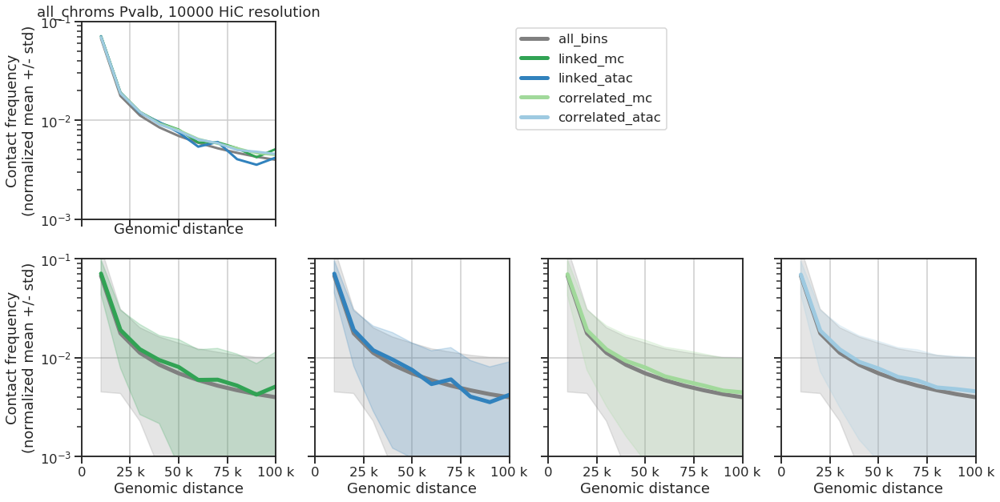

Sst
Sst 10000 chr1


100%|██████████| 10/10 [00:00<00:00, 291.03it/s]


Sst 10000 chr2


100%|██████████| 10/10 [00:00<00:00, 340.08it/s]


Sst 10000 chr3


100%|██████████| 10/10 [00:00<00:00, 355.66it/s]


Sst 10000 chr4


100%|██████████| 10/10 [00:00<00:00, 404.06it/s]


Sst 10000 chr5


100%|██████████| 10/10 [00:00<00:00, 259.12it/s]


Sst 10000 chr6


100%|██████████| 10/10 [00:00<00:00, 410.67it/s]


Sst 10000 chr7


100%|██████████| 10/10 [00:00<00:00, 425.00it/s]


Sst 10000 chr8


100%|██████████| 10/10 [00:00<00:00, 421.33it/s]


Sst 10000 chr9


100%|██████████| 10/10 [00:00<00:00, 436.29it/s]


Sst 10000 chr10


100%|██████████| 10/10 [00:00<00:00, 410.72it/s]


Sst 10000 chr11


100%|██████████| 10/10 [00:00<00:00, 409.18it/s]


Sst 10000 chr12


100%|██████████| 10/10 [00:00<00:00, 424.91it/s]


Sst 10000 chr13


100%|██████████| 10/10 [00:00<00:00, 472.28it/s]


Sst 10000 chr14


100%|██████████| 10/10 [00:00<00:00, 459.14it/s]


Sst 10000 chr15


100%|██████████| 10/10 [00:00<00:00, 477.68it/s]


Sst 10000 chr16


100%|██████████| 10/10 [00:00<00:00, 498.60it/s]


Sst 10000 chr17


100%|██████████| 10/10 [00:00<00:00, 456.04it/s]


Sst 10000 chr18


100%|██████████| 10/10 [00:00<00:00, 516.37it/s]


Sst 10000 chr19


100%|██████████| 10/10 [00:00<00:00, 572.94it/s]


Sst 10000 chr20


100%|██████████| 10/10 [00:00<00:00, 222.37it/s]


Sst 10000 chr21


100%|██████████| 10/10 [00:00<00:00, 671.73it/s]


Sst 10000 chr22


100%|██████████| 10/10 [00:00<00:00, 529.12it/s]


Sst 10000 chrX


100%|██████████| 10/10 [00:00<00:00, 560.86it/s]


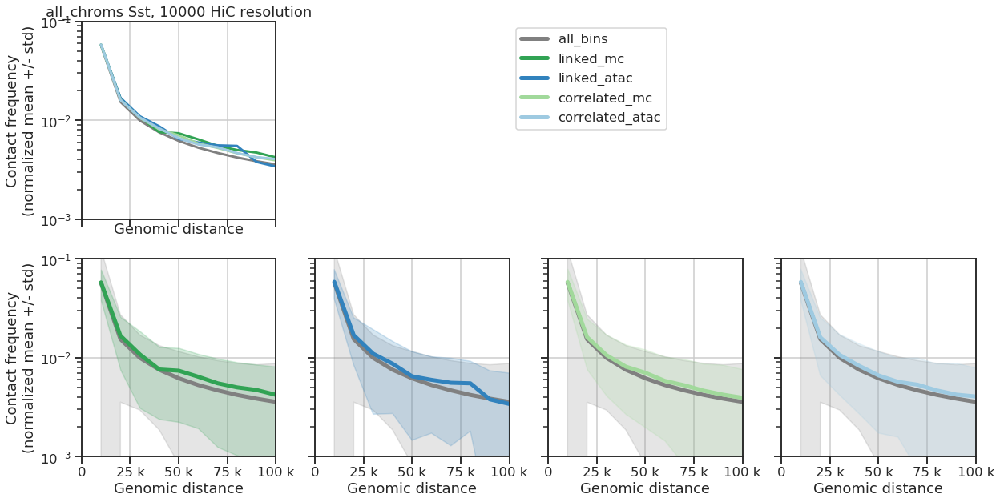

Vip
Vip 10000 chr1


100%|██████████| 10/10 [00:00<00:00, 320.95it/s]


Vip 10000 chr2


100%|██████████| 10/10 [00:00<00:00, 317.91it/s]


Vip 10000 chr3


100%|██████████| 10/10 [00:00<00:00, 363.86it/s]


Vip 10000 chr4


100%|██████████| 10/10 [00:00<00:00, 398.02it/s]


Vip 10000 chr5


100%|██████████| 10/10 [00:00<00:00, 255.52it/s]


Vip 10000 chr6


100%|██████████| 10/10 [00:00<00:00, 398.09it/s]


Vip 10000 chr7


100%|██████████| 10/10 [00:00<00:00, 411.64it/s]


Vip 10000 chr8


100%|██████████| 10/10 [00:00<00:00, 431.22it/s]


Vip 10000 chr9


100%|██████████| 10/10 [00:00<00:00, 146.87it/s]


Vip 10000 chr10


100%|██████████| 10/10 [00:00<00:00, 394.69it/s]


Vip 10000 chr11


100%|██████████| 10/10 [00:00<00:00, 415.43it/s]


Vip 10000 chr12


100%|██████████| 10/10 [00:00<00:00, 410.19it/s]


Vip 10000 chr13


100%|██████████| 10/10 [00:00<00:00, 519.15it/s]


Vip 10000 chr14


100%|██████████| 10/10 [00:00<00:00, 480.75it/s]


Vip 10000 chr15


100%|██████████| 10/10 [00:00<00:00, 477.81it/s]


Vip 10000 chr16


100%|██████████| 10/10 [00:00<00:00, 493.49it/s]


Vip 10000 chr17


100%|██████████| 10/10 [00:00<00:00, 474.38it/s]


Vip 10000 chr18


100%|██████████| 10/10 [00:00<00:00, 509.22it/s]


Vip 10000 chr19


100%|██████████| 10/10 [00:00<00:00, 589.12it/s]


Vip 10000 chr20


100%|██████████| 10/10 [00:00<00:00, 512.44it/s]


Vip 10000 chr21


100%|██████████| 10/10 [00:00<00:00, 653.79it/s]


Vip 10000 chr22


100%|██████████| 10/10 [00:00<00:00, 533.48it/s]


Vip 10000 chrX


100%|██████████| 10/10 [00:00<00:00, 572.44it/s]


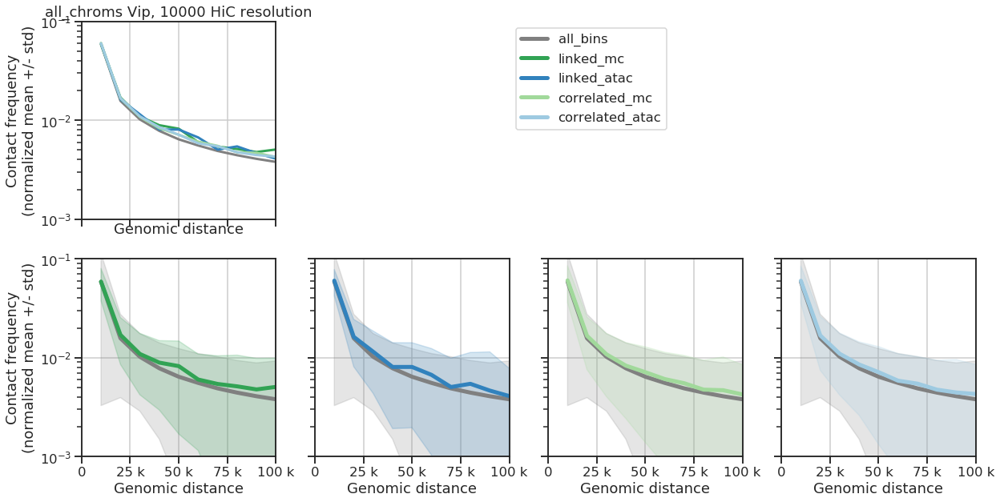

Ndnf
Ndnf 10000 chr1


100%|██████████| 10/10 [00:00<00:00, 328.61it/s]


Ndnf 10000 chr2


100%|██████████| 10/10 [00:00<00:00, 337.51it/s]


Ndnf 10000 chr3


100%|██████████| 10/10 [00:00<00:00, 365.47it/s]


Ndnf 10000 chr4


100%|██████████| 10/10 [00:00<00:00, 395.01it/s]


Ndnf 10000 chr5


100%|██████████| 10/10 [00:00<00:00, 386.10it/s]


Ndnf 10000 chr6


100%|██████████| 10/10 [00:00<00:00, 389.25it/s]


Ndnf 10000 chr7


100%|██████████| 10/10 [00:00<00:00, 407.63it/s]


Ndnf 10000 chr8


100%|██████████| 10/10 [00:00<00:00, 434.25it/s]


Ndnf 10000 chr9


100%|██████████| 10/10 [00:00<00:00, 422.45it/s]


Ndnf 10000 chr10


100%|██████████| 10/10 [00:00<00:00, 366.46it/s]


Ndnf 10000 chr11


100%|██████████| 10/10 [00:00<00:00, 363.44it/s]


Ndnf 10000 chr12


100%|██████████| 10/10 [00:00<00:00, 412.14it/s]


Ndnf 10000 chr13


100%|██████████| 10/10 [00:00<00:00, 491.45it/s]


Ndnf 10000 chr14


100%|██████████| 10/10 [00:00<00:00, 465.10it/s]


Ndnf 10000 chr15


100%|██████████| 10/10 [00:00<00:00, 477.15it/s]


Ndnf 10000 chr16


100%|██████████| 10/10 [00:00<00:00, 485.06it/s]


Ndnf 10000 chr17


100%|██████████| 10/10 [00:00<00:00, 458.31it/s]


Ndnf 10000 chr18


100%|██████████| 10/10 [00:00<00:00, 515.06it/s]


Ndnf 10000 chr19


100%|██████████| 10/10 [00:00<00:00, 580.94it/s]


Ndnf 10000 chr20


100%|██████████| 10/10 [00:00<00:00, 511.01it/s]


Ndnf 10000 chr21


100%|██████████| 10/10 [00:00<00:00, 658.72it/s]


Ndnf 10000 chr22


100%|██████████| 10/10 [00:00<00:00, 543.11it/s]


Ndnf 10000 chrX


100%|██████████| 10/10 [00:00<00:00, 572.76it/s]


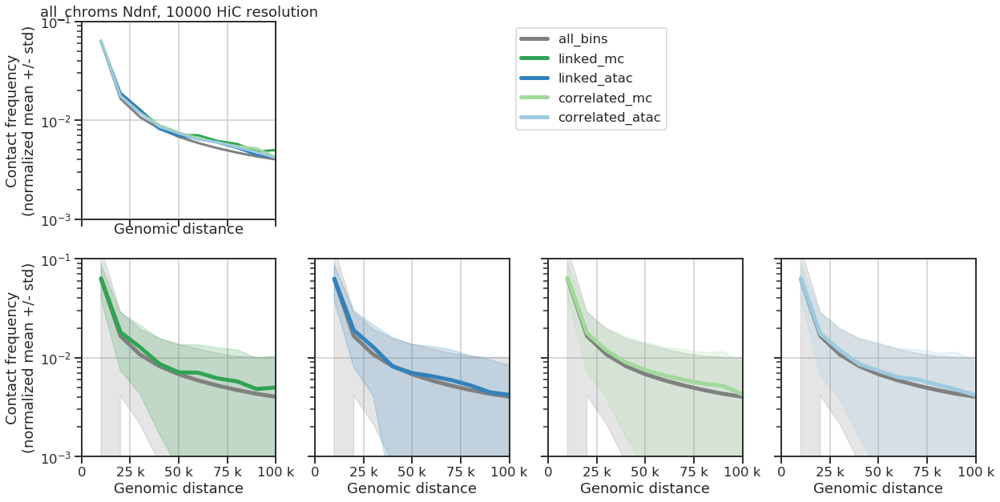

In [125]:
# celltype = 'L2_3' 

# distances
distance_cutoff = 1e5
distance_idx = np.arange(1, int(distance_cutoff/resolution)+1)
distances = distance_idx * resolution

for celltype in celltypes:
    print(celltype)
    
    contacts = [[] for i in np.arange(len(distances))]
    contacts_sig_pairs = collections.OrderedDict({
            'linked_mc': [[] for i in np.arange(len(distances))],
            'linked_atac': [[] for i in np.arange(len(distances))],
            'correlated_mc': [[] for i in np.arange(len(distances))],
            'correlated_atac': [[] for i in np.arange(len(distances))],
        })

    for chromosome in chromosomes:
        print(celltype, resolution, chromosome)

        # read in the matrix 
        resource_string = (
             '/sphere/fangming/enhancers/data_m3c/{}_all_brain.txt_1kb_contacts.mcool'
             '::/resolutions/{}'.format(celltype, resolution)
             )
        c = cooler.Cooler(resource_string)
        mat_all = c.matrix(balance=True).fetch(chromosome)

        enhs = enh_list[enh_list['chr']==chromosome]
        tsss = tss_list[tss_list['chr']==chromosome]

        # get paired bins
        paired_bin_tables = collections.OrderedDict({
            'linked_mc': enh_gene_id_to_binidx(linked_pairs_mc, tsss, enhs, resolution),
            'linked_atac': enh_gene_id_to_binidx(linked_pairs_atac, tsss, enhs, resolution),
            'correlated_mc': enh_gene_id_to_binidx(correlated_pairs_mc, tsss, enhs, resolution),
            'correlated_atac': enh_gene_id_to_binidx(correlated_pairs_atac, tsss, enhs, resolution),
        })
        track_names = list(paired_bin_tables.keys())
        colors = [
            mod_palette_comp['mc'][0],
            mod_palette_comp['atac'][0],
            mod_palette_comp['mc'][2],
            mod_palette_comp['atac'][2],
        ]

        # contact stats
        (_contacts, _contacts_sig_pairs
        ) = get_contacts(mat_all, paired_bin_tables, resolution, distance_idx)

        # combine all chromosomes 
        for idx, dist in enumerate(distances):
            contacts[idx] += list(_contacts[idx])
            for key in _contacts_sig_pairs.keys():
                contacts_sig_pairs[key][idx] += list(_contacts_sig_pairs[key][idx])

    # stats
    contacts_mean = np.array([np.nanmean(val) for val in contacts])
    contacts_std = np.array([np.nanstd(val) for val in contacts])
    contacts_n = np.array([len(val) for val in contacts])

    contacts_sig_pairs_mean = collections.OrderedDict({
        key: np.zeros(len(distances)) 
        for key in contacts_sig_pairs.keys()
    })
    contacts_sig_pairs_std = contacts_sig_pairs_mean.copy()
    contacts_sig_pairs_n = contacts_sig_pairs_mean.copy()

    for key in contacts_sig_pairs.keys():
        contacts_sig_pairs_mean[key] = np.array([np.nanmean(val) 
                                                 for val in contacts_sig_pairs[key]])

        contacts_sig_pairs_std[key] = np.array([np.nanstd(val) 
                                                for val in contacts_sig_pairs[key]])
        
        contacts_sig_pairs_n[key] = np.array([len(val) 
                                              for val in contacts_sig_pairs[key]])

    
    # run and save results
    output_res = ('/sphere/fangming/enhancers/scripts/results_new/'
                  'hic_contact_enrichment_{}_{}.pkl'.format(celltype, resolution,)
                 )

    output_fig = ('/sphere/fangming/enhancers/scripts/figures/'
                  'hic_contact_enrichment_{}_{}.pdf'.format(celltype, resolution,)
                 )
    # save results
    # distances, contacts_mean, contacts_std ## these are numpy arrays 
    # contacts_sig_pairs_mean, contacts_sig_pairs_std ## these
    with open(output_res, 'wb') as fwh:
        pickle.dump((distances, 
                     contacts_mean, contacts_std, contacts_n,
                     contacts_sig_pairs_mean, 
                     contacts_sig_pairs_std,
                     contacts_sig_pairs_n,
                    ), fwh)

    # plot
    plot_contact_stats(
        'all_chroms', celltype, resolution,
        distances, contacts_mean, contacts_std, 
        contacts_sig_pairs_mean, contacts_sig_pairs_std, 
        track_names, colors,
        output_fig,
        )

    

# Summarize results 
- by chromosomes and cell types

In [66]:
track_names = [
    'linked_mc',
    'linked_atac',
    'correlated_mc',
    'correlated_atac',
]

colors = [
    mod_palette_comp['mc'][0],
    mod_palette_comp['atac'][0],
    mod_palette_comp['mc'][2],
    mod_palette_comp['atac'][2],
]

celltype_palette = {
    'L2_3': '#845EC2',
    'L4': '#D65DB1',
    'L5': '#FF6F91',
    'L6': '#FF9671',
    'Pvalb': '#FFC75F',
    'Sst': '#F9F871',
    'Vip': '#2C73D2',
    'Ndnf': '#008E9B',
}

chromosomes = ['chr'+str(i+1) for i in range(22)] + ['chrX']
celltypes = ['L2_3', 'L4', 'L5', 'L6', 
             'Pvalb', 'Sst', 'Vip', 'Ndnf']
resolution = 10000

## flavor 0 - null across chromosomes 

In [78]:
res_all = []
for celltype in celltypes:
    for chromosome in chromosomes:
        # run and save res_allults
        input_res = ('/sphere/fangming/enhancers/scripts/results_new/'
                      'hic_contact_enrichment_{}_{}_{}.pkl'.format(celltype, resolution, chromosome)
                     )

        # get 
        with open(input_res, 'rb') as fh:
            (distances, contacts_mean, contacts_std, 
             contacts_sig_pairs_mean, contacts_sig_pairs_std, 
            ) = pickle.load(fh)

        res_all.append({
            'celltype': celltype,
            'chr': chromosome,
            'null_mean': contacts_mean,
            'null_std': contacts_std,
        })
res_all = pd.DataFrame(res_all)
print(res_all.shape)
res_all.head()

(184, 4)


,celltype,chr,null_mean,null_std
0,L2_3,chr1,"[0.0644353952529, 0.0177950987081, 0.011787758...","[0.0181741854517, 0.00679004239395, 0.00527030..."
1,L2_3,chr2,"[0.0628573631141, 0.0172811122416, 0.011393072...","[0.0174144106046, 0.00609166194246, 0.00491742..."
2,L2_3,chr3,"[0.0632346915273, 0.0175346553569, 0.011647436...","[0.0175693187623, 0.00612438855297, 0.00495388..."
3,L2_3,chr4,"[0.0617774019656, 0.0171255167886, 0.011203769...","[0.017474600042, 0.0059191525819, 0.0047255875..."
4,L2_3,chr5,"[0.0631045324844, 0.017537766577, 0.0115961443...","[0.0175610391636, 0.00629491113469, 0.00498735..."


No handles with labels found to put in legend.


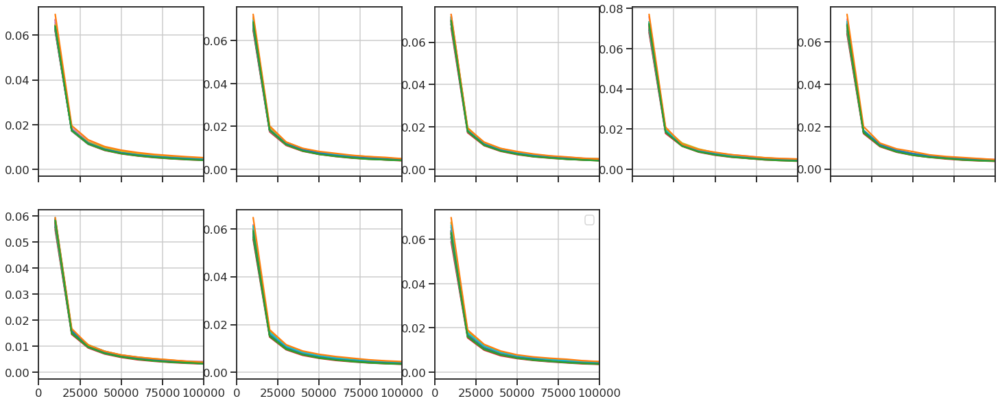

In [86]:
res_plot = res_all.set_index(['chr', 'celltype'])

# n = len(chromosomes)
n = len(celltypes)

nx = 5
ny = int((n+nx-1)/nx)

fig, axs = plt.subplots(ny, nx, figsize=(5*nx,5*ny), sharex=True,)
for (celltype, ax) in zip(celltypes, axs.flat):
#     for chromosome, ax in zip(chromosomes, axs.flat):
    for chromosome in chromosomes:
        ax.plot(distances, res_plot.loc[chromosome, celltype]['null_mean'], 
#                 label=celltype, color=celltype_palette[celltype],
               )
    ax.set_xlim([0, 1e5])
    
axs.flat[n-1].legend(bbox_to_anchor=(1,1))
for ax in axs.flat[n:]:
    ax.axis('off')
plt.show()
        
# for idx, row in mean_fc_all.iterrows():
#     celltype = row['celltype']
#     if row['chr'] == chromosome:
#         for ax, track_name, color in zip(axs, track_names, colors):
#             ax.plot(distances, np.clip(np.log2(row['mean_fc'][track_name]), -1, 1), 
#                     label=celltype, color=celltype_palette[celltype],
#                    )
    
# for ax, track_name, color in zip(axs, track_names, colors):
    
#     ax.xaxis.set_major_formatter(mtick.EngFormatter())
#     ax.set_xlabel('Genomic distance')
#     ax.set_xlim([0, 1e5])
#     ax.set_ylim([-1, 1])
#     ax.set_yticks([-1,0,1])
    
#     ax.set_title(track_name)
#     ax.axhline(0, linestyle='--', color='gray')
    
# axs[0].set_ylabel('log2 FC')
# ax.legend(bbox_to_anchor=(1,1), loc='upper left')

# fig.suptitle(chromosome, fontsize=20)
# #     ax.set_ylim([1e-3, 1e-1])
# #     ax.set_ylabel('Contact frequency\n(normalized mean +/- std)')
# #     ax.set_title("{} {}, {} HiC resolution".format(chromosome, celltype, resolution))
    
# plt.show() 
    

## flavor 1 - mean FC

In [47]:
mean_fc_all = []

for celltype in celltypes:
    for chromosome in chromosomes:
        # run and save results
        input_res = ('/sphere/fangming/enhancers/scripts/results_new/'
                      'hic_contact_enrichment_{}_{}_{}.pkl'.format(celltype, resolution, chromosome)
                     )

        # get 
        with open(input_res, 'rb') as fh:
            (distances, contacts_mean, contacts_std, 
             contacts_sig_pairs_mean, contacts_sig_pairs_std, 
            ) = pickle.load(fh)

        # mean FC
        mean_fcs = collections.OrderedDict()
        for key, item in contacts_sig_pairs_mean.items():
            mean_fcs[key] = item/contacts_mean
        
        mean_fc_all.append({
            'celltype': celltype,
            'chr': chromosome,
            'mean_fc': mean_fcs,
        })
mean_fc_all = pd.DataFrame(mean_fc_all)
print(mean_fc_all.shape)
mean_fc_all.head()

(184, 3)


,celltype,chr,mean_fc
0,L2_3,chr1,"{'linked_mc': [1.07246768775, 1.16717613464, 1..."
1,L2_3,chr2,"{'linked_mc': [0.921135817643, 0.876589225533,..."
2,L2_3,chr3,"{'linked_mc': [1.05631899354, 1.04508885836, 1..."
3,L2_3,chr4,"{'linked_mc': [0.990197111955, 1.06143211272, ..."
4,L2_3,chr5,"{'linked_mc': [1.00466816981, 1.0026132597, 1...."


/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log2
  if __name__ == '__main__':


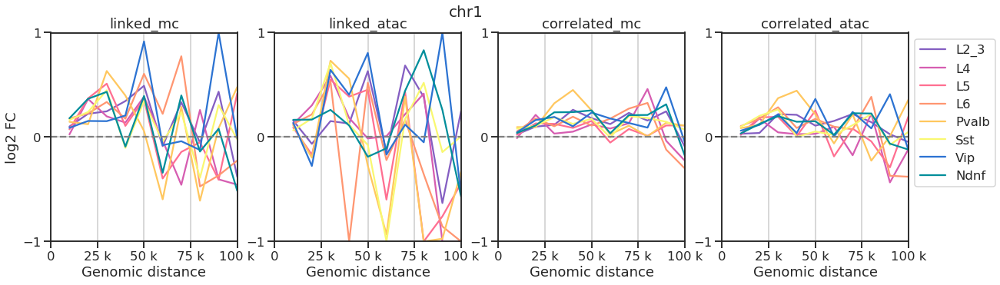

In [75]:

chromosome = 'chr1'

fig, axs = plt.subplots(1, 4, figsize=(5*4,5), sharex=True,)
for idx, row in mean_fc_all.iterrows():
    celltype = row['celltype']
    if row['chr'] == chromosome:
        for ax, track_name, color in zip(axs, track_names, colors):
            ax.plot(distances, np.clip(np.log2(row['mean_fc'][track_name]), -1, 1), 
                    label=celltype, color=celltype_palette[celltype],
                   )
    
for ax, track_name, color in zip(axs, track_names, colors):
    
    ax.xaxis.set_major_formatter(mtick.EngFormatter())
    ax.set_xlabel('Genomic distance')
    ax.set_xlim([0, 1e5])
    ax.set_ylim([-1, 1])
    ax.set_yticks([-1,0,1])
    
    ax.set_title(track_name)
    ax.axhline(0, linestyle='--', color='gray')
    
axs[0].set_ylabel('log2 FC')
ax.legend(bbox_to_anchor=(1,1), loc='upper left')

fig.suptitle(chromosome, fontsize=20)
#     ax.set_ylim([1e-3, 1e-1])
#     ax.set_ylabel('Contact frequency\n(normalized mean +/- std)')
#     ax.set_title("{} {}, {} HiC resolution".format(chromosome, celltype, resolution))
    
plt.show() 
    

/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log2
  if __name__ == '__main__':


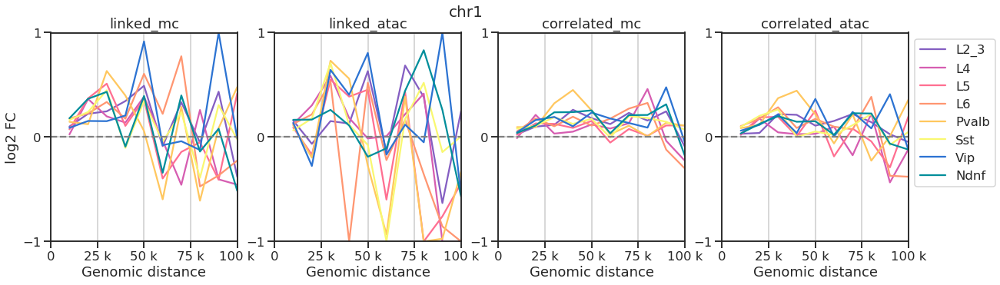

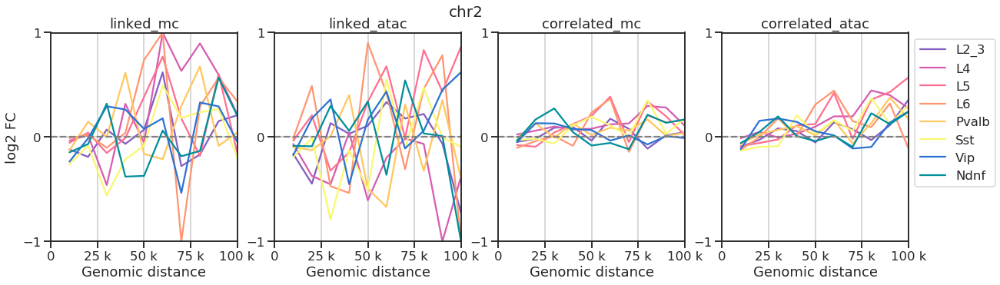

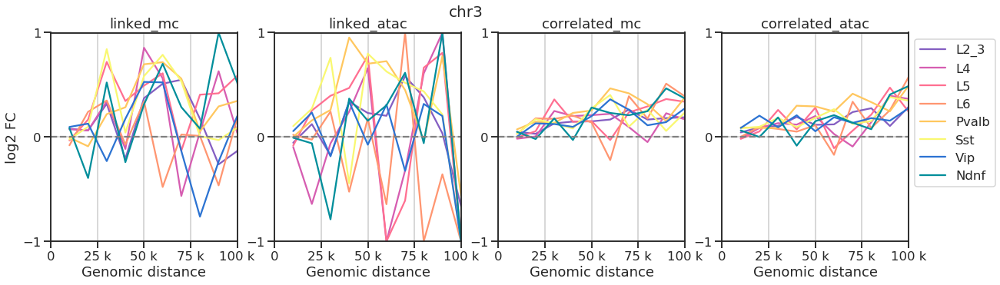

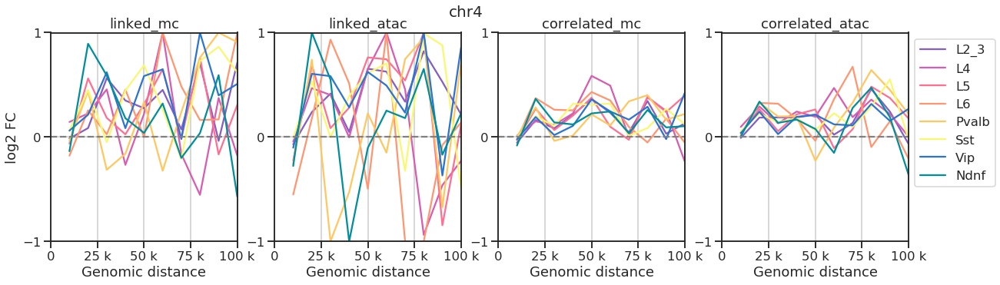

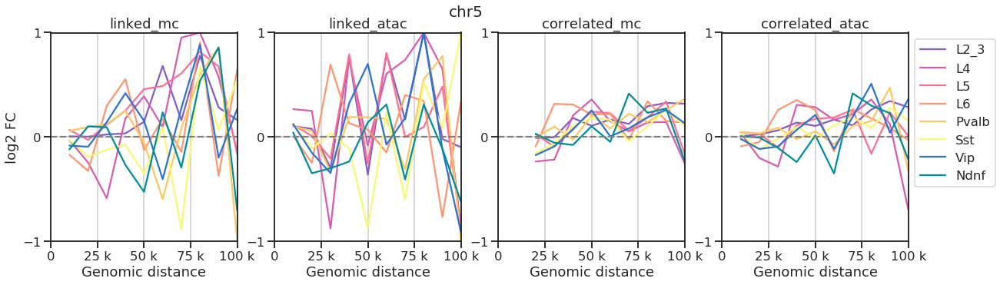

...

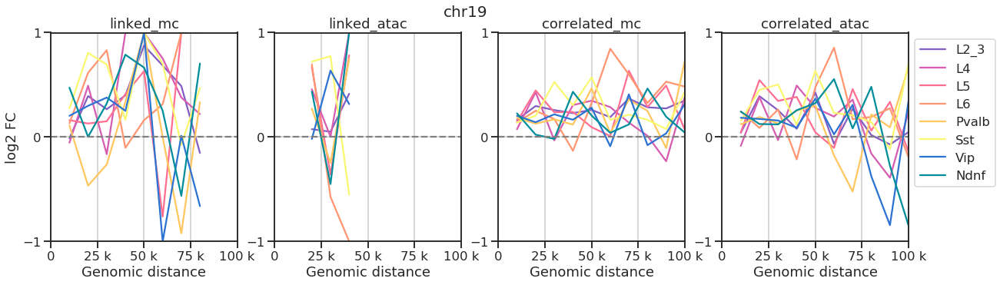

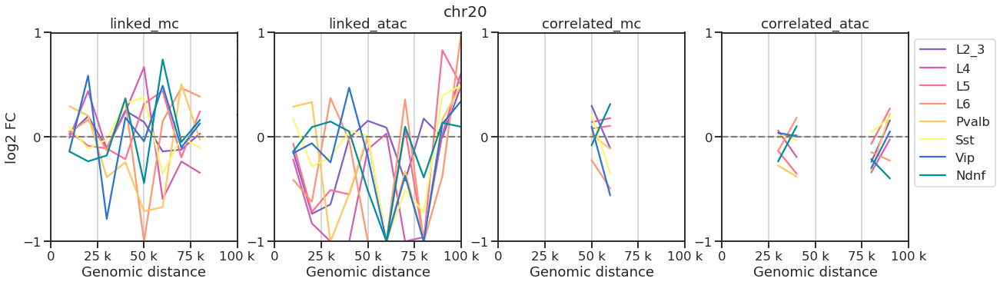

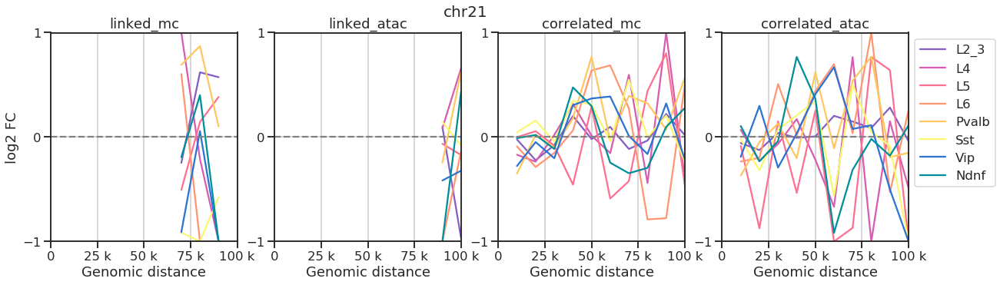

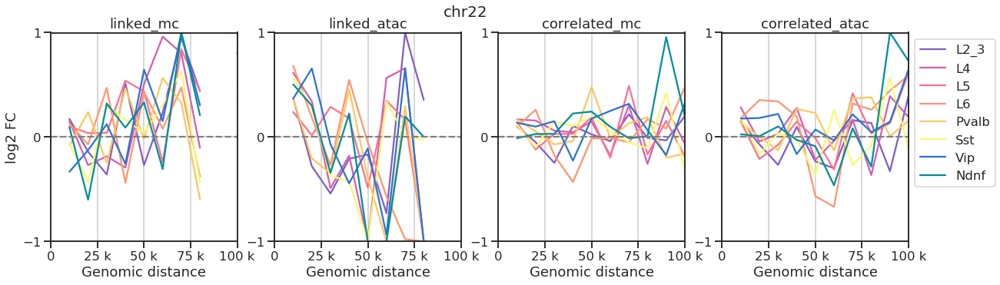

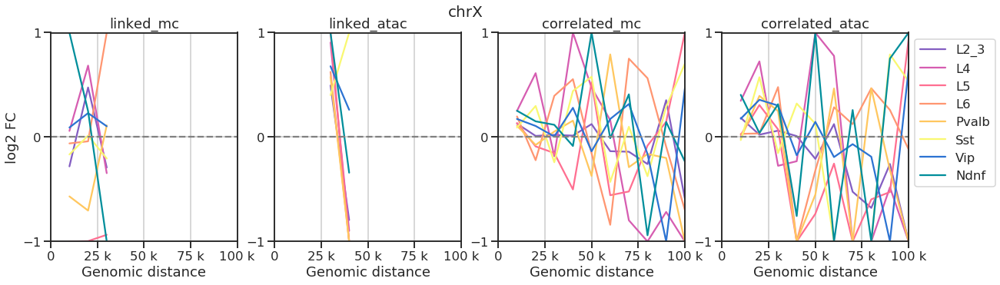

In [76]:
# all chromosomes
for chromosome in chromosomes:
    fig, axs = plt.subplots(1, 4, figsize=(5*4,5), sharex=True,)
    for idx, row in mean_fc_all.iterrows():
        celltype = row['celltype']
        if row['chr'] == chromosome:
            for ax, track_name, color in zip(axs, track_names, colors):
                ax.plot(distances, np.clip(np.log2(row['mean_fc'][track_name]), -1, 1), 
                        label=celltype, color=celltype_palette[celltype],
                       )

    for ax, track_name, color in zip(axs, track_names, colors):

        ax.xaxis.set_major_formatter(mtick.EngFormatter())
        ax.set_xlabel('Genomic distance')
        ax.set_xlim([0, 1e5])
        ax.set_ylim([-1, 1])
        ax.set_yticks([-1,0,1])

        ax.set_title(track_name)
        ax.axhline(0, linestyle='--', color='gray')

    axs[0].set_ylabel('log2 FC')
    ax.legend(bbox_to_anchor=(1,1), loc='upper left')

    fig.suptitle(chromosome, fontsize=20)
    #     ax.set_ylim([1e-3, 1e-1])
    #     ax.set_ylabel('Contact frequency\n(normalized mean +/- std)')
    #     ax.set_title("{} {}, {} HiC resolution".format(chromosome, celltype, resolution))

    plt.show() 


## flavor 2 - summarized across all chroms

### Plot 1 

In [126]:
distances

array([ 10000,  20000,  30000,  40000,  50000,  60000,  70000,  80000,
        90000, 100000])

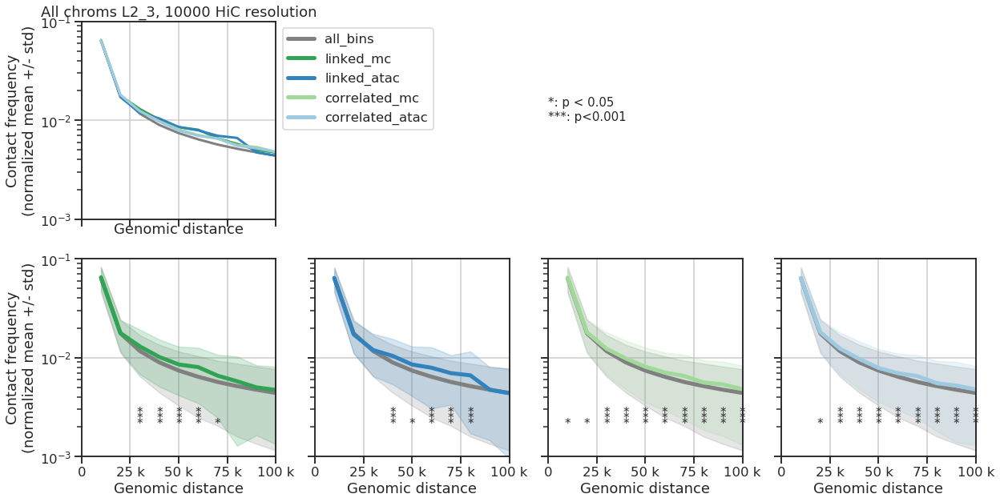

In [137]:
celltype = 'L2_3'
resolution = 10000

output_fig = ('/sphere/fangming/enhancers/scripts/figures/'
              'hic_contact_enrichment_{}_{}.pdf'.format(celltype, resolution,)
             )
input_res = ('/sphere/fangming/enhancers/scripts/results_new/'
              'hic_contact_enrichment_{}_{}.pkl'.format(celltype, resolution)
             )

# get 
with open(input_res, 'rb') as fh:
    (distances, 
     contacts_mean, contacts_std, contacts_n,
     contacts_sig_pairs_mean, 
     contacts_sig_pairs_std, 
     contacts_sig_pairs_n, 
    ) = pickle.load(fh)

p_th1 = 0.05
p_th2 = 0.001

# proc
mean_fcs = collections.OrderedDict()
padjs = collections.OrderedDict()
for key, item in contacts_sig_pairs_mean.items():
    # mean FC
    mean_fcs[key] = item/contacts_mean
    
    # significance t-test
    t, p = stats.ttest_ind_from_stats(contacts_mean, contacts_std, contacts_n, 
                                      contacts_sig_pairs_mean[key],
                                      contacts_sig_pairs_std[key],
                                      contacts_sig_pairs_n[key],
                                      equal_var=True)
    # multiple comparison 
    _, padj, _, _ = multipletests(p, alpha=0.05, method='hs', is_sorted=False, returnsorted=False)
    
    # 
    padjs[key] = padj
    
# plot 
fig, axs = plt.subplots(2, 4, figsize=(5*4,5*2), sharey=True, sharex=True)

# all together
ax = axs[0,0]
_x, _y, _yerr = distances, contacts_mean, contacts_std
color='gray'
ax.plot(_x, _y, '-', color=color, linewidth=3, label='all_bins')
for i, (_name, _color) in enumerate(zip(track_names, colors)):
    _x, _y, _yerr = distances, contacts_sig_pairs_mean[_name], contacts_sig_pairs_std[_name]
    ax.plot(_x, _y, '-', color=_color, linewidth=3, label=_name)
    
ax.xaxis.set_major_formatter(mtick.EngFormatter())
ax.set_yscale('log')
ax.set_xlabel('Genomic distance')
ax.set_xlim([0, 1e5])
ax.set_ylim([1e-3, 1e-1])
ax.set_ylabel('Contact frequency\n(normalized mean +/- std)')
ax.set_title("{} {}, {} HiC resolution".format('All chroms', celltype, resolution))

for ax in axs[0,1:]:
    ax.axis('off')

# specific plots
for i, (ax, _name, _color) in enumerate(zip(axs[1], track_names, colors)):
    _x, _y, _yerr = distances, contacts_mean, contacts_std
    color='gray'
    ax.fill_between(_x, _y-_yerr, _y+_yerr, color=color, alpha=0.2)
    ax.plot(_x, _y, '-', color=color, linewidth=5, label='all_bins', alpha=1)

    _x, _y, _yerr = distances, contacts_sig_pairs_mean[_name], contacts_sig_pairs_std[_name]
    ax.fill_between(_x, _y-_yerr, _y+_yerr, color=_color, alpha=0.2)
    ax.plot(_x, _y, '-', color=_color, linewidth=5, label=_name, alpha=1)
    
    
    pvals = padjs[_name]
    for idx, dist in enumerate(distances):
        if pvals[idx] < p_th2:
            ax.text(dist, 0.002, '*\n*\n*', fontsize=15, linespacing=0.3, ha='center')
        elif pvals[idx] < p_th1: 
            ax.text(dist, 0.002, '*', fontsize=15, ha='center')

    ax.xaxis.set_major_formatter(mtick.EngFormatter())
    ax.set_yscale('log')
    ax.set_xlabel('Genomic distance')
    ax.set_xlim([0, 1e5])
    ax.set_ylim([1e-3, 1e-1])

    if i == 0:
        ax.set_ylabel('Contact frequency\n(normalized mean +/- std)')

# legends
handles, labels = snmcseq_utils.combine_legends(axs.flat)
handles, labels = snmcseq_utils.dedup_legends(handles, labels)
axs[0,0].legend(handles, labels, bbox_to_anchor=(1,1), loc='upper left')

axs[0,2].annotate("*: p < 0.05\n***: p<0.001", (0, 0.5), xycoords='axes fraction', fontsize=15)


snmcseq_utils.savefig(fig, output_fig)
plt.show()

### Plot 2  - all cell types

In [128]:
mean_fc_all = []

for celltype in celltypes:
    # run and save results
    input_res = ('/sphere/fangming/enhancers/scripts/results_new/'
                  'hic_contact_enrichment_{}_{}.pkl'.format(celltype, resolution)
                 )

    # get 
    with open(input_res, 'rb') as fh:
        (distances, 
         contacts_mean, contacts_std, contacts_n,
         contacts_sig_pairs_mean, 
         contacts_sig_pairs_std, 
         contacts_sig_pairs_n, 
        ) = pickle.load(fh)

    # proc
    mean_fcs = collections.OrderedDict()
#     padjs = collections.OrderedDict()
    for key, item in contacts_sig_pairs_mean.items():
        # mean FC
        mean_fcs[key] = item/contacts_mean
        
#         # significance t-test
#         t, p = stats.ttest_ind_from_stats(contacts_mean, contacts_std, contacts_n, 
#                                           contacts_sig_pairs_mean[key],
#                                           contacts_sig_pairs_std[key],
#                                           contacts_sig_pairs_n[key],
#                                           equal_var=True)
#         # multiple comparison 
#         _, padj, _, _ = multipletests(p, alpha=0.05, method='hs', is_sorted=False, returnsorted=False)
        
#         # 
#         padjs[key] = padj
        
    
    mean_fc_all.append({
        'celltype': celltype,
        'mean_fc': mean_fcs,
#         'p_adj': padjs,
    })
    
mean_fc_all = pd.DataFrame(mean_fc_all)
print(mean_fc_all.shape)
mean_fc_all.head()

(8, 2)


,celltype,mean_fc
0,L2_3,"{'linked_mc': [1.0196549723, 1.00670381608, 1...."
1,L4,"{'linked_mc': [1.02412527261, 1.06417459141, 1..."
2,L5,"{'linked_mc': [1.00825906137, 1.09015911928, 1..."
3,L6,"{'linked_mc': [1.03126699154, 1.03552112602, 1..."
4,Pvalb,"{'linked_mc': [1.05363112399, 1.08187287492, 1..."


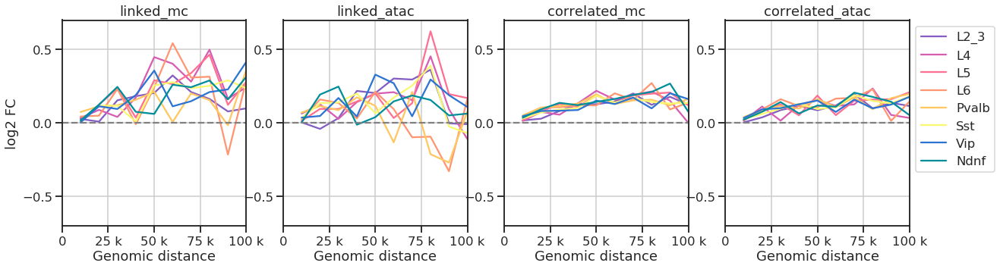

In [129]:
output_fig = ('/sphere/fangming/enhancers/scripts/figures/'
              'hic_contact_enrichment_summarized_FC.pdf'
             )

p_th = 0.05

fig, axs = plt.subplots(1, 4, figsize=(5*4,5), sharex=True,)
for idx, row in mean_fc_all.iterrows():
    celltype = row['celltype']
    for ax, track_name, color in zip(axs, track_names, colors):
        ax.plot(distances, np.clip(np.log2(row['mean_fc'][track_name]), -1, 1), 
                label=celltype, color=celltype_palette[celltype],
               )
#         ax.plot(distances, -1+1/2*(row['p_adj'][track_name]<p_th).astype(int), 
#                 'o',
#                 label=celltype, color=celltype_palette[celltype],
#                )
    
for ax, track_name, color in zip(axs, track_names, colors):
    
    ax.xaxis.set_major_formatter(mtick.EngFormatter())
    ax.set_xlabel('Genomic distance')
    ax.set_xlim([0, 1e5])
    ax.set_ylim([-0.7, 0.7])
    ax.set_yticks([-0.5,0,0.5])
    
    ax.set_title(track_name)
    ax.axhline(0, linestyle='--', color='gray')
    
axs[0].set_ylabel('log2 FC')
ax.legend(bbox_to_anchor=(1,1), loc='upper left')

# fig.suptitle("", fontsize=20)
snmcseq_utils.savefig(fig, output_fig)
plt.show() 

### Plot 3 - all cell types and all distances

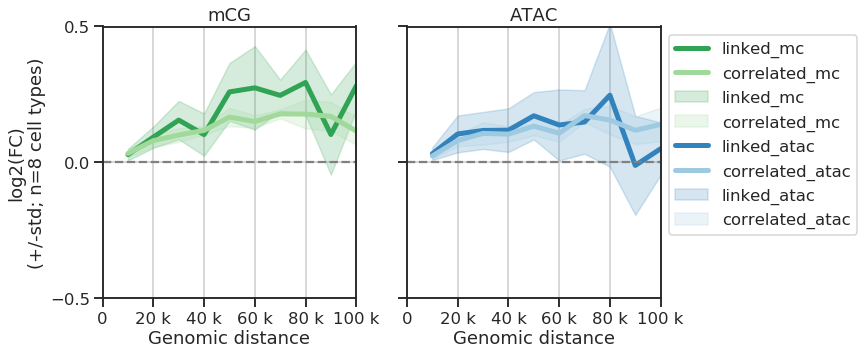

In [171]:
output_fig = ('/sphere/fangming/enhancers/scripts/figures/'
              'hic_contact_enrichment_summarized_FC_v2.pdf'
             )

ys = {track_name: [] for track_name in track_names}
for idx, row in mean_fc_all.iterrows():
    celltype = row['celltype']
    for track_name, color in zip(track_names, colors):
        ys[track_name].append(
            np.clip(np.log2(row['mean_fc'][track_name]), -1, 1)
            )
ys_mean = {track_name: np.array(ys[track_name]).mean(axis=0) for track_name in track_names}
ys_std = {track_name: np.array(ys[track_name]).std(axis=0) for track_name in track_names}
        
fig, axs = plt.subplots(1, 2, figsize=(5*2,5), sharey=True, sharex=True)
ax = axs[0]
for track_name, color in zip(track_names, colors):
    if track_name.endswith('_mc'):
        ax.fill_between(distances, 
                ys_mean[track_name]-ys_std[track_name], 
                ys_mean[track_name]+ys_std[track_name], 
                label=track_name, color=color,
                alpha=0.2
               )
        ax.plot(distances, ys_mean[track_name], 
                label=track_name, color=color,
                linewidth=5,
               )
ax.set_title('mCG')
ax.xaxis.set_major_formatter(mtick.EngFormatter())
ax.set_xlabel('Genomic distance')
ax.set_ylabel('log2(FC)\n(+/-std; n=8 cell types)')
ax.set_xlim([0, 1e5])
ax.set_ylim([-0.5, 0.5])
ax.set_yticks([-0.5,0,0.5])

ax.axhline(0, linestyle='--', color='gray')
        
ax = axs[1]
for track_name, color in zip(track_names, colors):
    if track_name.endswith('_atac'):
        ax.fill_between(distances, 
                ys_mean[track_name]-ys_std[track_name], 
                ys_mean[track_name]+ys_std[track_name], 
                label=track_name, color=color,
                alpha=0.2
               )
        ax.plot(distances, ys_mean[track_name], 
                label=track_name, color=color,
                linewidth=5,
               )
ax.set_title('ATAC')
ax.xaxis.set_major_formatter(mtick.EngFormatter())
ax.set_xlabel('Genomic distance')
ax.set_xlim([0, 1e5])
ax.set_ylim([-0.5, 0.5])
ax.set_yticks([-0.5,0,0.5])

ax.axhline(0, linestyle='--', color='gray')
    
    

handles, labels = snmcseq_utils.combine_legends(axs.flat)
# handles, labels = snmcseq_utils.dedup_legends(handles, labels)
ax.legend(handles, labels, bbox_to_anchor=(1,1), loc='upper left')

snmcseq_utils.savefig(fig, output_fig)
plt.show() 